In [1]:
import pandas as pd
import pygmt
from matplotlib.colors import to_hex
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
geo_df=pd.read_csv('../geological_map/waor_station_geology.csv')
geo_df.head(5)

,netst,stlo,stla,geometry,index_right,STATE,ORIG_LABEL,SGMC_LABEL,UNIT_LINK,UNIT_NAME,...,INDETERMIN,REF_ID,REFERENCE,GENERALIZE,DIGITAL_UR,NGMDB1,NGMDB2,NGMDB3,RuleID,FIPS_C
0,CC.ASBU,-121.368401,43.820560,POINT (-121.368401 43.82056),9310.0,OR,Qyb,Qyb;0,ORQyb;0,Youngest basalt and basaltic andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0
1,CC.BRSP,-121.708427,45.401550,POINT (-121.708427 45.40155),5175.0,OR,Qa,Qa;0,ORQa;0,Andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0
2,CC.CARB,-122.005409,46.988319,POINT (-122.005409 46.988319),310.0,WA,E2,EO2;0,WAEO2;0,Lower upper Eocene marine and nonmarine rocks,...,NaN,WA097,"Raines, Gary L., and Johnson, Bruce R., 1996, ...","Sedimentary, clastic",https://pubs.usgs.gov/of/1995/of95-684/,https://ngmdb.usgs.gov/Prodesc/proddesc_30777.htm,NaN,NaN,23.0,53.0
3,CC.CIHL,-121.148621,43.750969,POINT (-121.148621 43.750969),5796.0,OR,Qb,Qb;0,ORQb;0,Basalt and basaltic andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0
4,CC.CLBH,-122.143494,42.907745,POINT (-122.143494 42.907745),5168.0,OR,Qa,Qa;0,ORQa;0,Andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0


coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


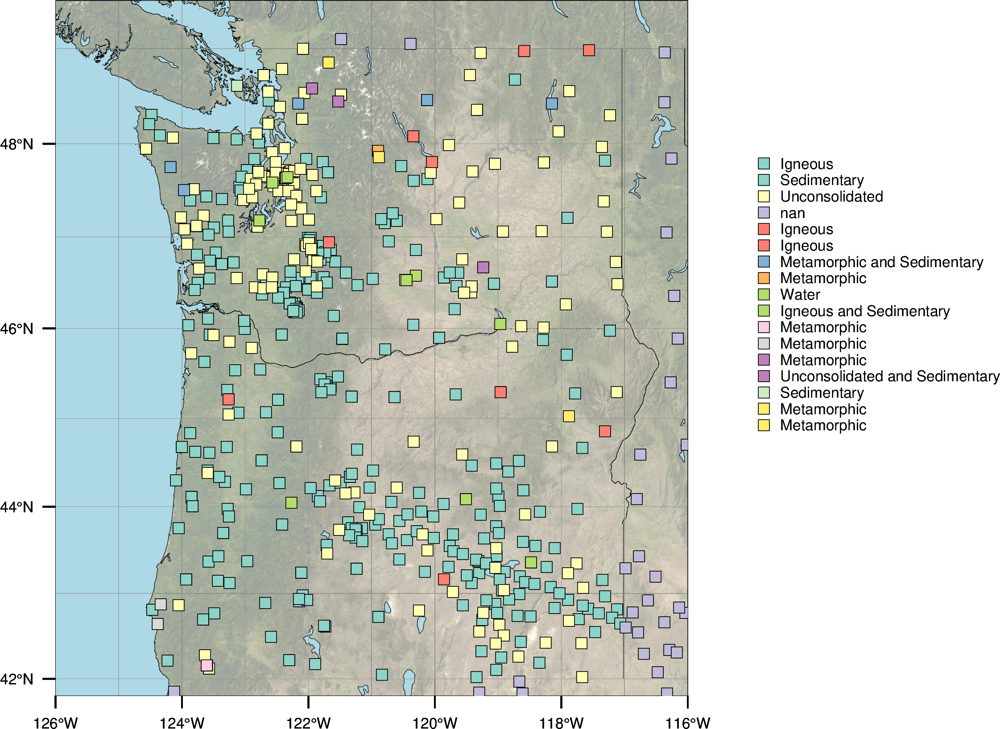

In [3]:

# Load CSV data
df = geo_df
df['GENERALIZE'] = df['GENERALIZE'].astype(str)  # Ensure categorical variable


region=[-126,-116,41.8,49.5]
proj='M6c'
# Initialize the figure
fig = pygmt.Figure()
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )

fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
# Plot each unique NA_L3KEY as a different color
unique_keys = df['GENERALIZE'].unique()

# Get colormap
cmap = plt.get_cmap('Set3', len(unique_keys))
# Plot each unique NA_L3NAME with corresponding color from the colormap
for i, key in enumerate(unique_keys):
    subset = df[df['GENERALIZE'] == key]
    
    # Check if subset is not empty
    if not subset.empty and len(subset) > 0:
        color = to_hex(cmap(i)[:3])  # Get the color from the colormap
        # print(f"Plotting {key} with color {color}")
        # Plot with the same length for x and y
        fig.plot(
            x=subset['stlo'],
            y=subset['stla'],
            style="s0.15c",  # Circle style with size
            pen="0.1p,black",
            fill=color,  # Use RGB values; color is returned as (R, G, B, A)
            label=key
        )
    else:
        print(f"No data to plot for {key}")

# Add a legend
fig.legend(position="JMR+o0.2i", )
fig.show(dpi=600)


coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


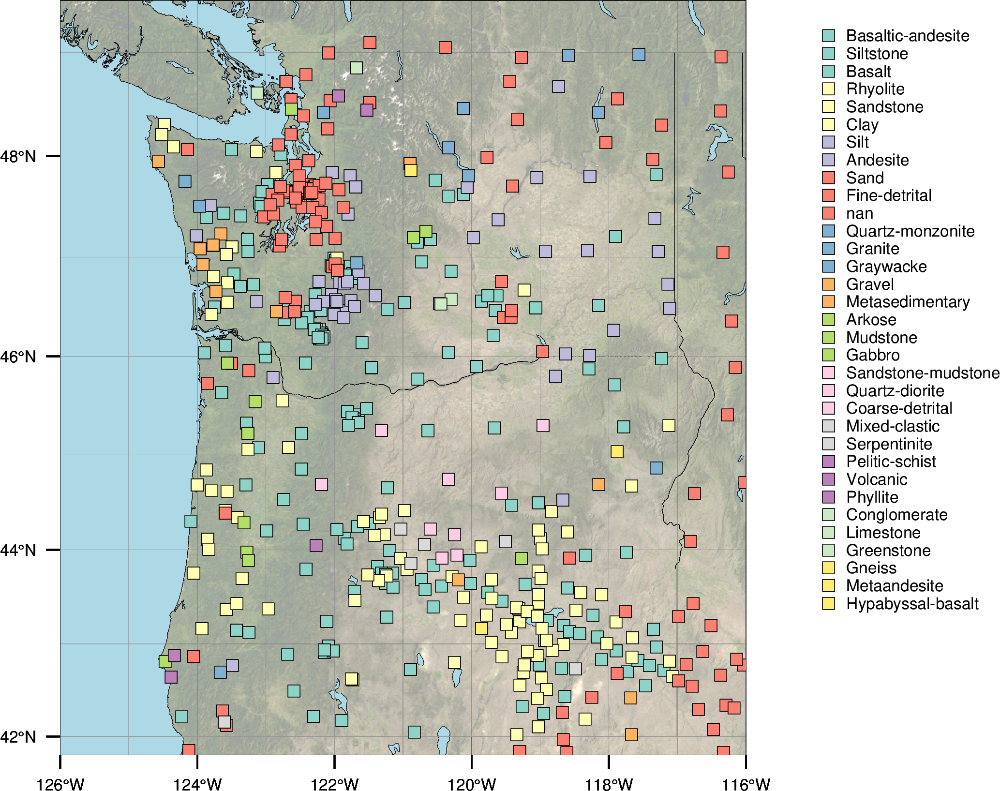

In [4]:
# Load CSV data
df = geo_df
df['MAJOR1'] = df['MAJOR1'].astype(str)  # Ensure categorical variable


region=[-126,-116,41.8,49.5]
proj='M6c'
# Initialize the figure
fig = pygmt.Figure()
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )

fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
# Plot each unique NA_L3KEY as a different color
unique_keys = df['MAJOR1'].unique()

# Get colormap
cmap = plt.get_cmap('Set3', len(unique_keys))
# Plot each unique NA_L3NAME with corresponding color from the colormap
for i, key in enumerate(unique_keys):
    subset = df[df['MAJOR1'] == key]
    
    # Check if subset is not empty
    if not subset.empty and len(subset) > 0:
        color = to_hex(cmap(i)[:3])  # Get the color from the colormap
        # print(f"Plotting {key} with color {color}")
        # Plot with the same length for x and y
        fig.plot(
            x=subset['stlo'],
            y=subset['stla'],
            style="s0.15c",  # Circle style with size
            pen="0.1p,black",
            fill=color,  # Use RGB values; color is returned as (R, G, B, A)
            label=key
        )
    else:
        print(f"No data to plot for {key}")

# Add a legend
fig.legend(position="JMR+o0.2i", )
fig.show(dpi=600)


In [5]:
fn1='Annual_BBQ_comb.csv'
pd_pnwbb = pd.read_csv(fn1)

In [6]:
# Merging pd1 with pd2 on the 'netst' column
merged_geo = pd_pnwbb.merge(geo_df, on='netst', how='left')
merged_geo = merged_geo[merged_geo.meanb > 0.01]

# Display the merged DataFrame
merged_geo.to_csv('merged_geo.csv', index=False)

coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


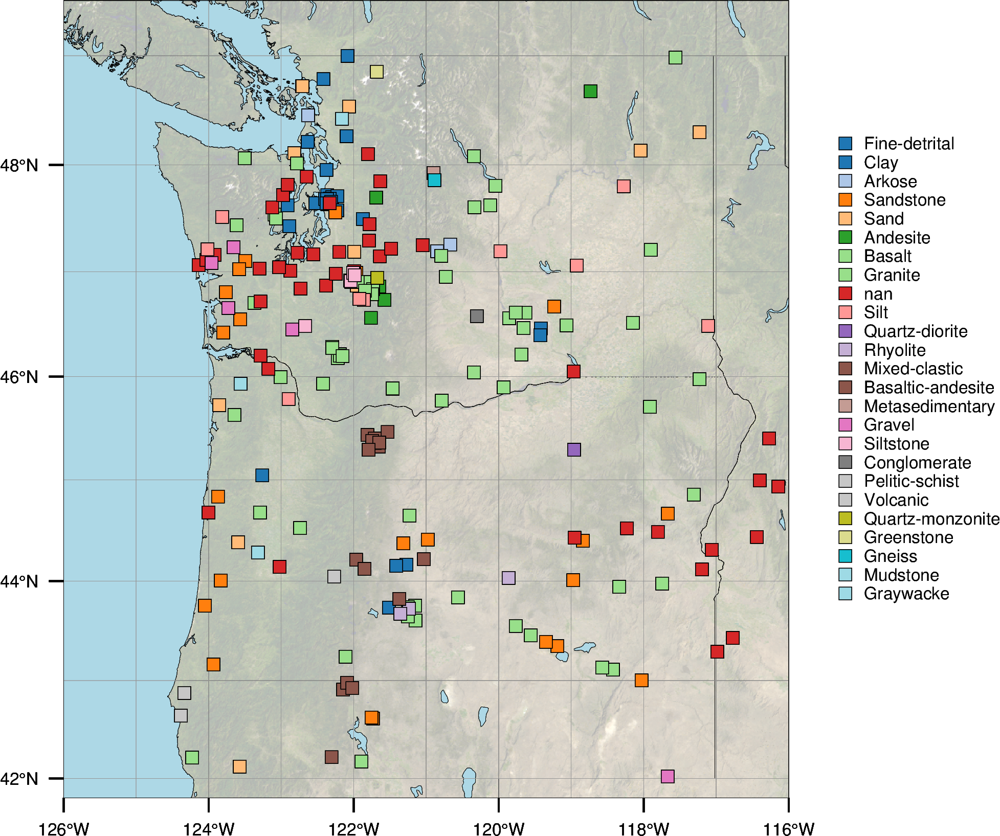

In [7]:
# Load CSV data
df = merged_geo
df['MAJOR1'] = df['MAJOR1'].astype(str)  # Ensure categorical variable


region=[-126,-116,41.8,49.5]
proj='M6c'
# Initialize the figure
fig = pygmt.Figure()
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=70, )

fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
# Plot each unique NA_L3KEY as a different color
unique_keys = df['MAJOR1'].unique()

# Get colormap
cmap = plt.get_cmap('tab20', len(unique_keys))
# Plot each unique NA_L3NAME with corresponding color from the colormap
for i, key in enumerate(unique_keys):
    subset = df[df['MAJOR1'] == key]
    
    # Check if subset is not empty
    if not subset.empty and len(subset) > 0:
        color = to_hex(cmap(i)[:3])  # Get the color from the colormap
        # print(f"Plotting {key} with color {color}")
        # Plot with the same length for x and y
        fig.plot(
            x=subset['stlo_x'],
            y=subset['stla_x'],
            style="s0.15c",  # Circle style with size
            pen="0.1p,black",
            fill=color,  # Use RGB values; color is returned as (R, G, B, A)
            label=key
        )
    else:
        print(f"No data to plot for {key}")

# Add a legend
fig.legend(position="JMR+o0.1i", )
fig.show(dpi=600)


In [9]:
# -122, -121.4, 46.7, 47
MtRainer=merged_geo[(merged_geo.stlo_x >-122) & (merged_geo.stlo_x <-121.4) & (merged_geo.stla_x >46.7) & (merged_geo.stla_x <47)]
# -121.9, -121.4, 45, 45.5
MtHood=merged_geo[(merged_geo.stlo_x >-121.9) & (merged_geo.stlo_x <-121.4) & (merged_geo.stla_x >45) & (merged_geo.stla_x <45.5)]
# -122.4, -121.9, 46, 46.4
MtStHelens=merged_geo[(merged_geo.stlo_x >-122.5) & (merged_geo.stlo_x <-121.9) & (merged_geo.stla_x >46) & (merged_geo.stla_x <46.4)]


/tmp/ipykernel_3272176/234120708.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['MAJOR1'] = df['MAJOR1'].astype(str)  # Ensure categorical variable
coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


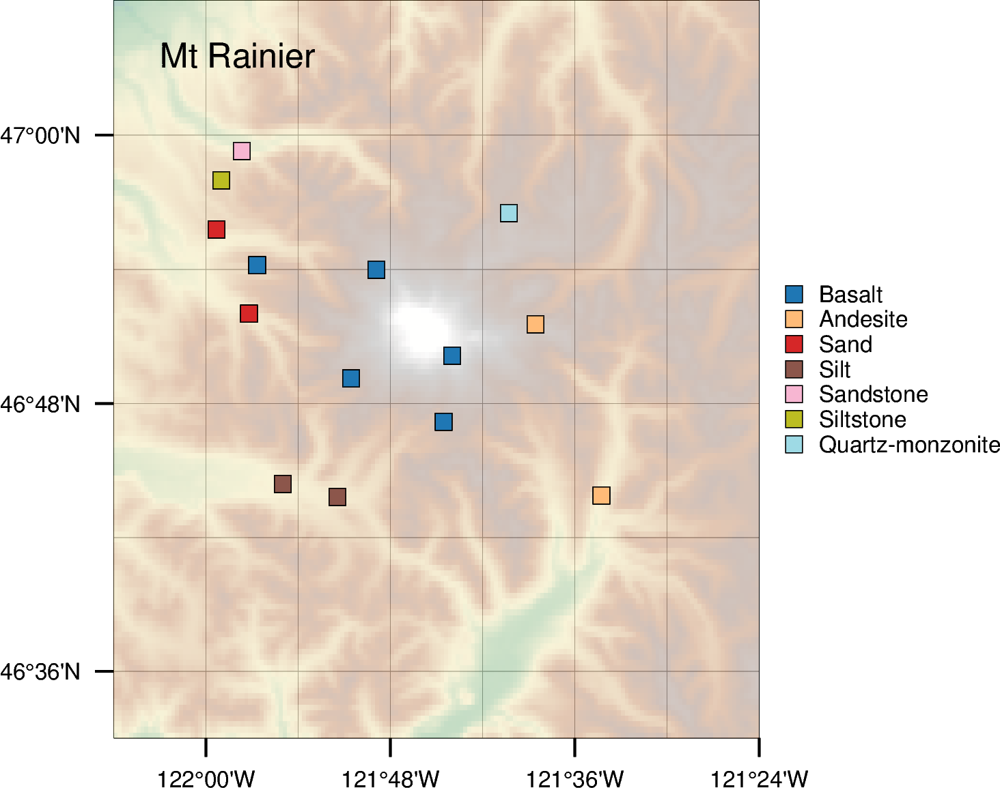

In [10]:
# Load CSV data
df = MtRainer
df['MAJOR1'] = df['MAJOR1'].astype(str)  # Ensure categorical variable

region=[-122.1, -121.4, 46.55, 47.1]
proj='M4c'
# Initialize the figure
fig = pygmt.Figure()
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a0.2g0.1", )
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=region)
fig.grdimage(grid=grid, projection=proj, transparency=70, cmap='geo')
fig.text(x=-122.05,y=47.05,text=f'Mt Rainier', font="6p,Helvetica,0", no_clip=True, justify="BL" )
    
fig.coast(region=region, projection=proj,  resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
# Plot each unique NA_L3KEY as a different color
unique_keys = df['MAJOR1'].unique()

# Get colormap
cmap = plt.get_cmap('tab20', len(unique_keys))
# Plot each unique NA_L3NAME with corresponding color from the colormap
for i, key in enumerate(unique_keys):
    subset = df[df['MAJOR1'] == key]
    
    # Check if subset is not empty
    if not subset.empty and len(subset) > 0:
        color = to_hex(cmap(i)[:3])  # Get the color from the colormap
        # print(f"Plotting {key} with color {color}")
        # Plot with the same length for x and y
        fig.plot(
            x=subset['stlo_x'],
            y=subset['stla_x'],
            style="s0.15c",  # Circle style with size
            pen="0.1p,black",
            fill=color,  # Use RGB values; color is returned as (R, G, B, A)
            label=key
        )
    else:
        print(f"No data to plot for {key}")

# Add a legend
fig.legend(position="JMR", )
fig.show(dpi=600)


/tmp/ipykernel_3272176/3492506078.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['MAJOR1'] = df['MAJOR1'].astype(str)  # Ensure categorical variable
coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


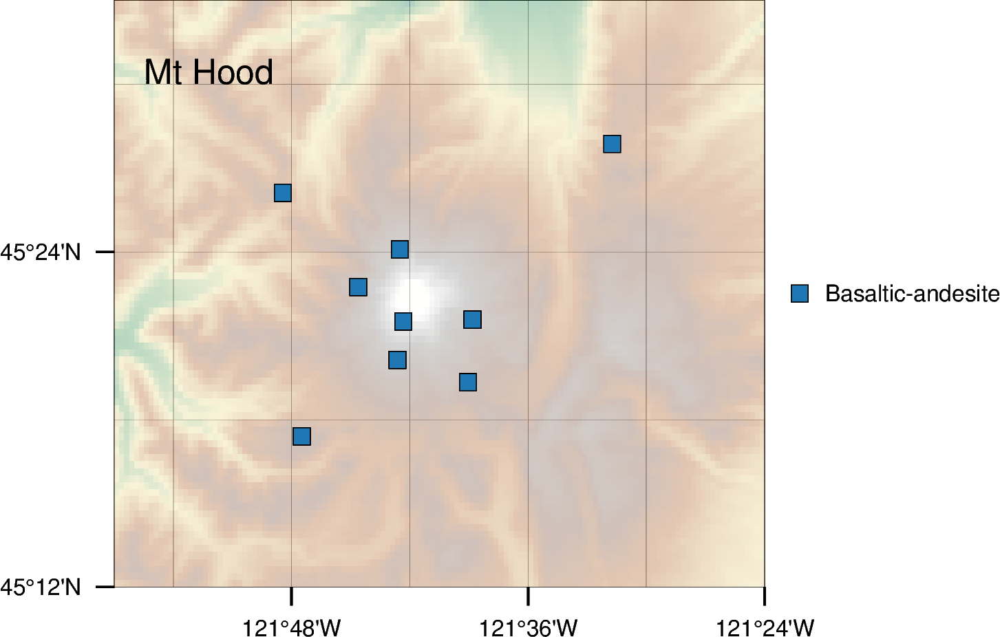

In [11]:
# Load CSV data
df = MtHood
df['MAJOR1'] = df['MAJOR1'].astype(str)  # Ensure categorical variable

region=[-121.95, -121.4, 45.2, 45.55]
proj='M4c'
# Initialize the figure
fig = pygmt.Figure()
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a0.2g0.1", )
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=region)
fig.grdimage(grid=grid, projection=proj, transparency=70, cmap='geo')
fig.text(x=-121.925,y=45.5,text=f'Mt Hood', font="6p,Helvetica,0", no_clip=True, justify="BL" )

fig.coast(region=region, projection=proj,  resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
# Plot each unique NA_L3KEY as a different color
unique_keys = df['MAJOR1'].unique()

# Get colormap
cmap = plt.get_cmap('tab20', len(unique_keys))
# Plot each unique NA_L3NAME with corresponding color from the colormap
for i, key in enumerate(unique_keys):
    subset = df[df['MAJOR1'] == key]
    
    # Check if subset is not empty
    if not subset.empty and len(subset) > 0:
        color = to_hex(cmap(i)[:3])  # Get the color from the colormap
        # print(f"Plotting {key} with color {color}")
        # Plot with the same length for x and y
        fig.plot(
            x=subset['stlo_x'],
            y=subset['stla_x'],
            style="s0.15c",  # Circle style with size
            pen="0.1p,black",
            fill=color,  # Use RGB values; color is returned as (R, G, B, A)
            label=key
        )
    else:
        print(f"No data to plot for {key}")

# Add a legend
fig.legend(position="JMR", )
fig.show(dpi=600)


/tmp/ipykernel_3272176/410535468.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['MAJOR1'] = df['MAJOR1'].astype(str)  # Ensure categorical variable
coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


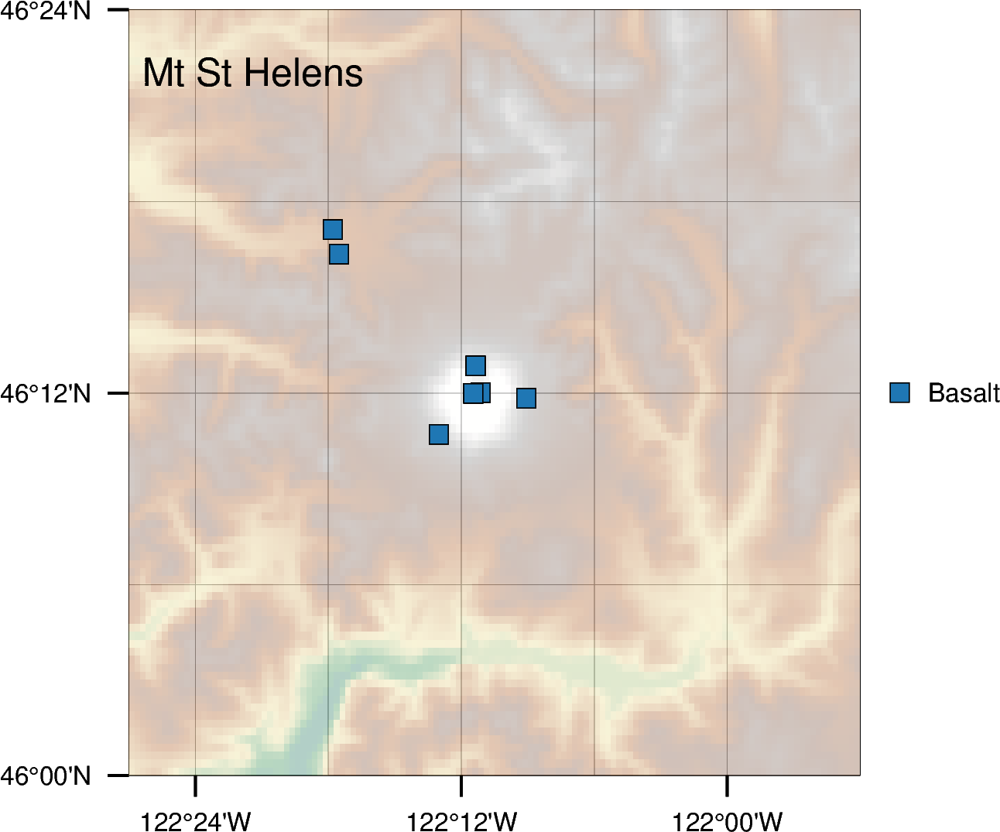

In [12]:
# Load CSV data
df = MtStHelens
df['MAJOR1'] = df['MAJOR1'].astype(str)  # Ensure categorical variable

region=[-122.45, -121.9, 46, 46.4]
proj='M4c'
# Initialize the figure
fig = pygmt.Figure()
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a0.2g0.1", )
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=region)
fig.grdimage(grid=grid, projection=proj, transparency=70, cmap='geo')
fig.text(x=-122.44,y=46.36,text=f'Mt St Helens', font="6p,Helvetica,0", no_clip=True, justify="BL" )

fig.coast(region=region, projection=proj,  resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
# Plot each unique NA_L3KEY as a different color
unique_keys = df['MAJOR1'].unique()

# Get colormap
cmap = plt.get_cmap('tab20', len(unique_keys))
# Plot each unique NA_L3NAME with corresponding color from the colormap
for i, key in enumerate(unique_keys):
    subset = df[df['MAJOR1'] == key]
    
    # Check if subset is not empty
    if not subset.empty and len(subset) > 0:
        color = to_hex(cmap(i)[:3])  # Get the color from the colormap
        # print(f"Plotting {key} with color {color}")
        # Plot with the same length for x and y
        fig.plot(
            x=subset['stlo_x'],
            y=subset['stla_x'],
            style="s0.15c",  # Circle style with size
            pen="0.1p,black",
            fill=color,  # Use RGB values; color is returned as (R, G, B, A)
            label=key
        )
    else:
        print(f"No data to plot for {key}")

# Add a legend
fig.legend(position="JMR", )
fig.show(dpi=600)


In [15]:
geo_filtered = merged_geo[merged_geo['MAJOR1'].map(merged_geo['MAJOR1'].value_counts()) > 3]

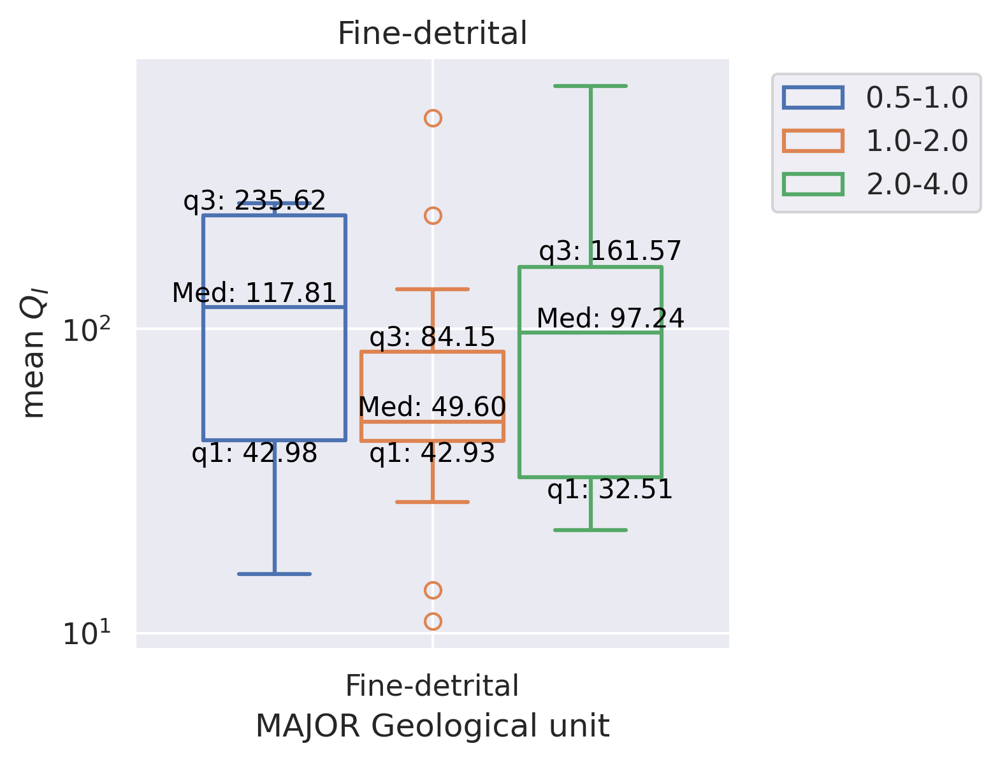

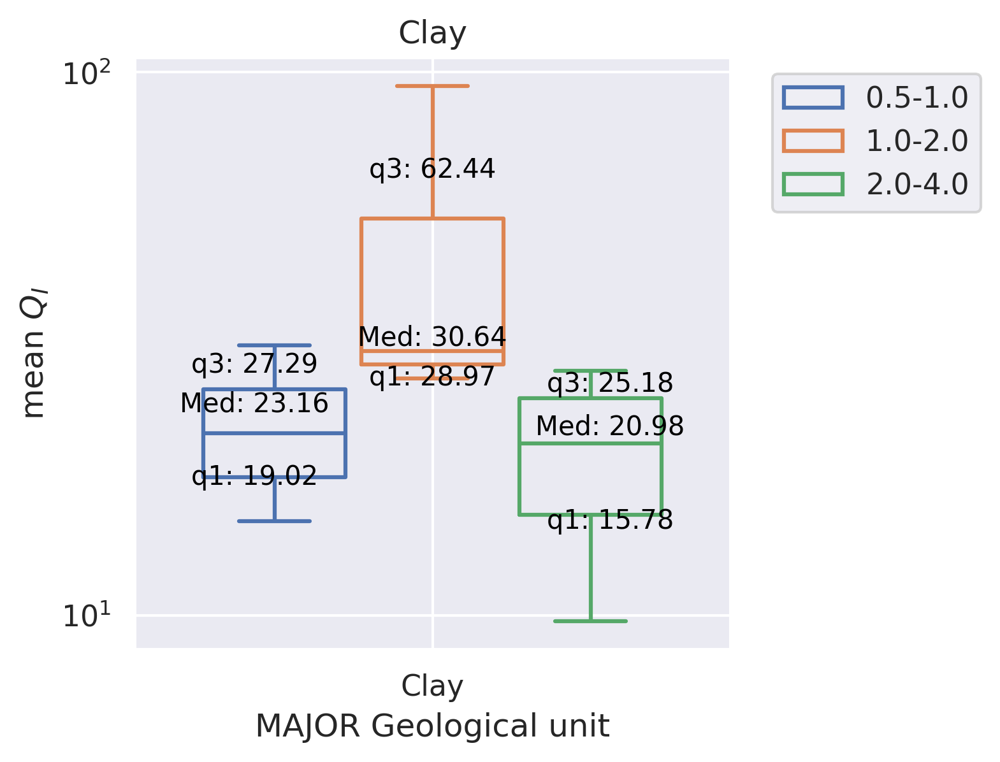

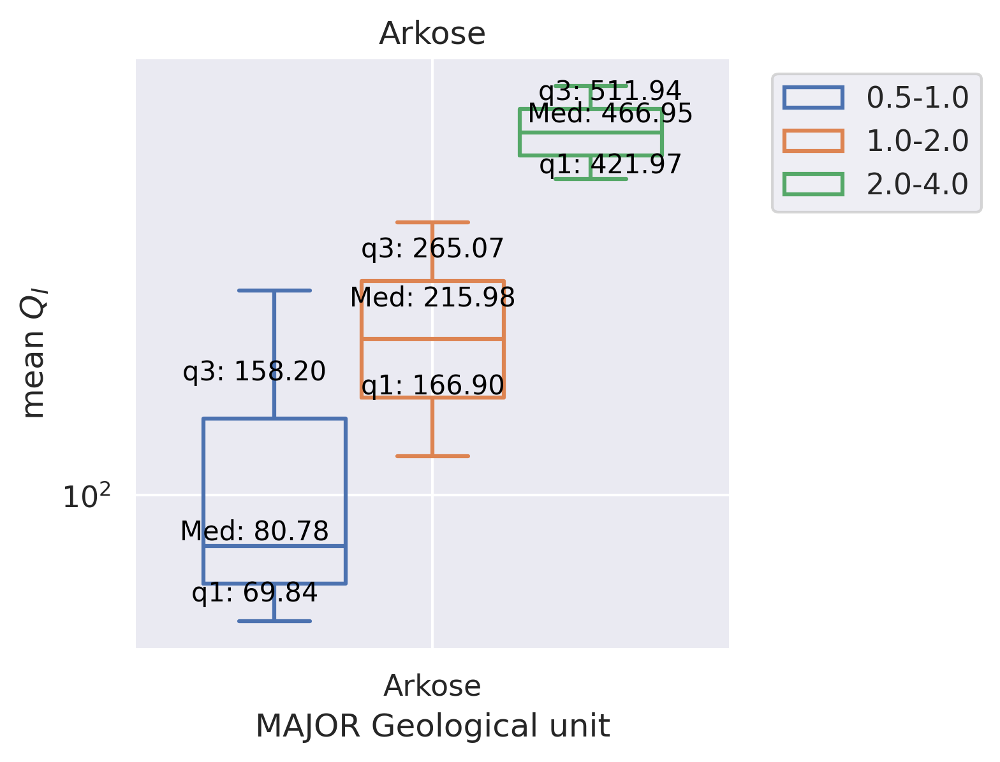

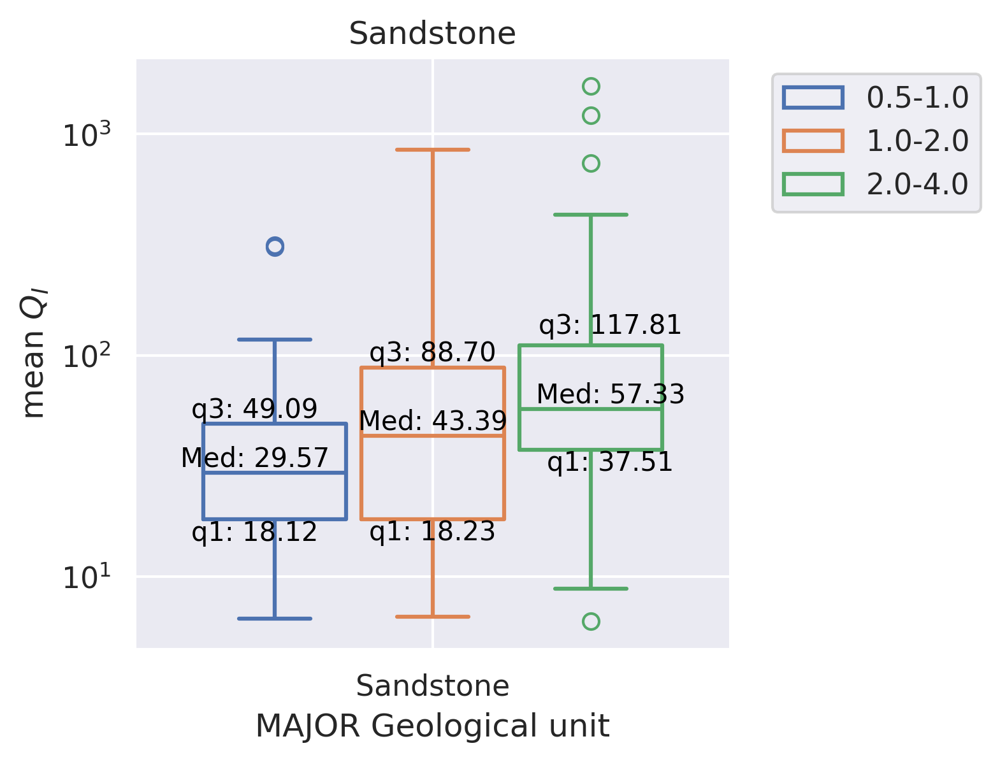

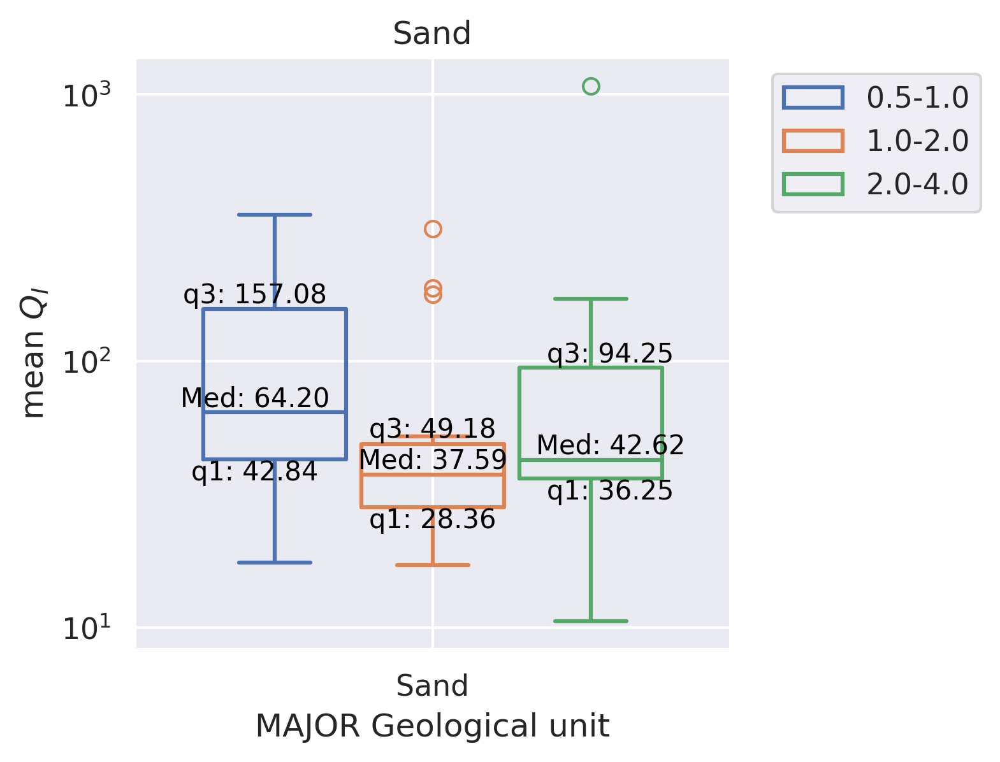

...

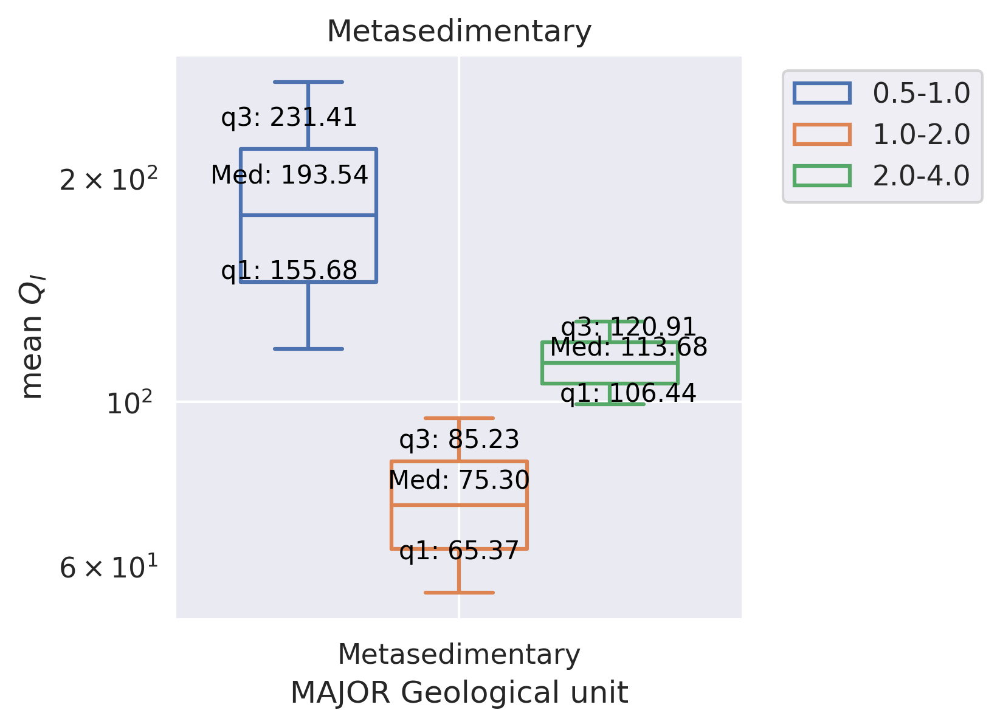

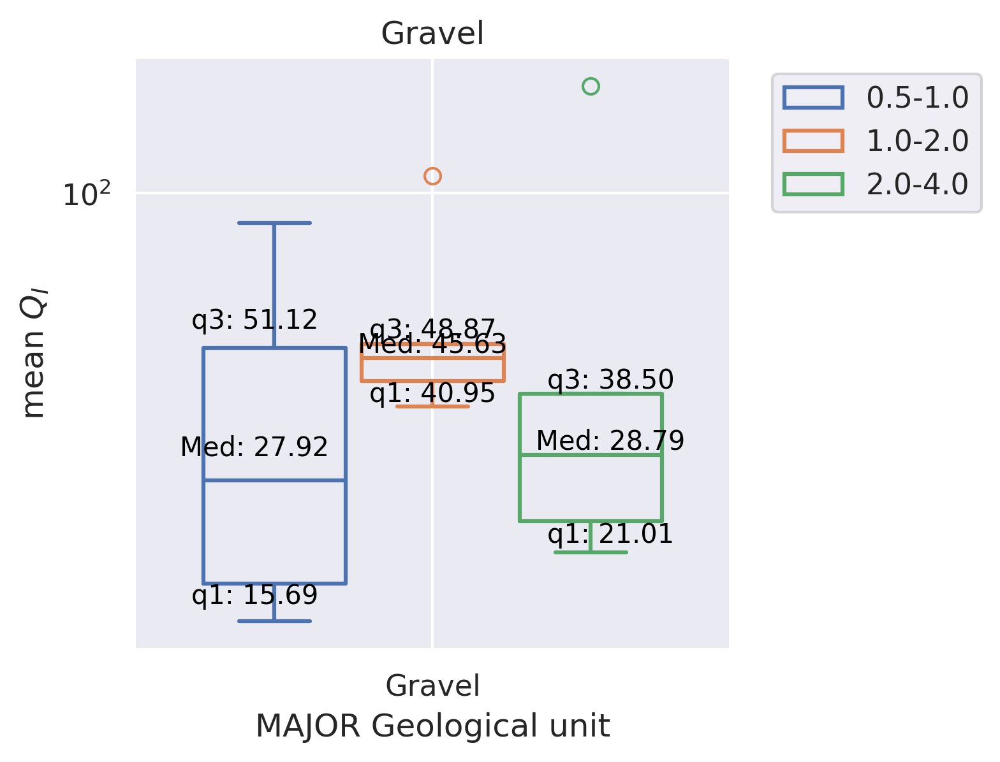

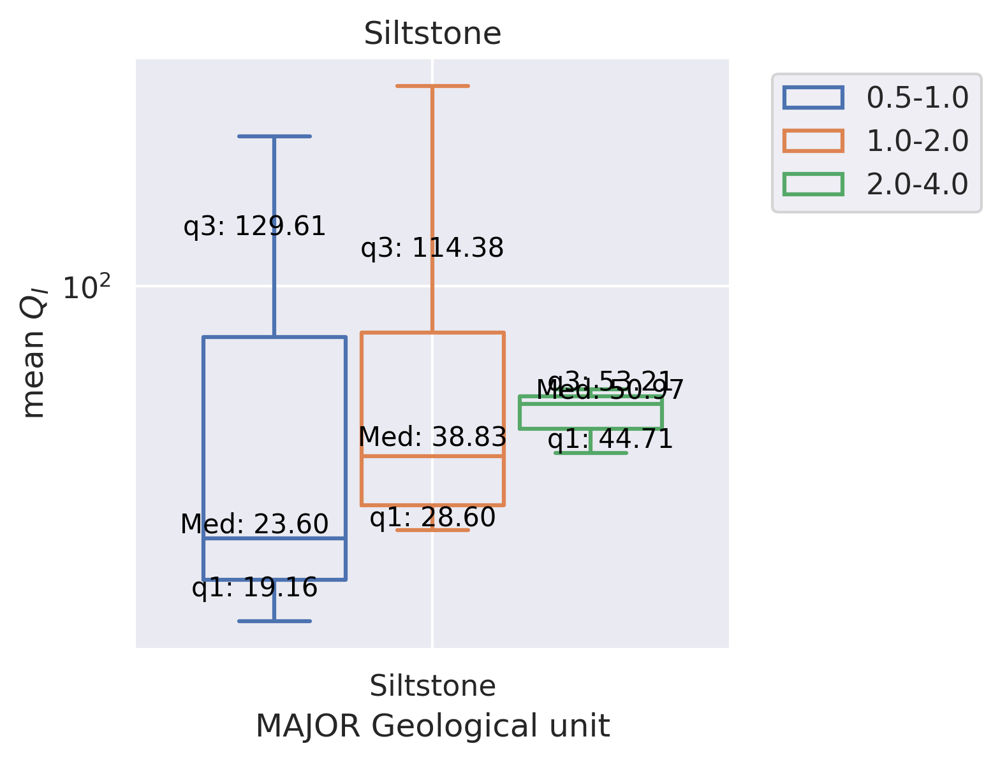

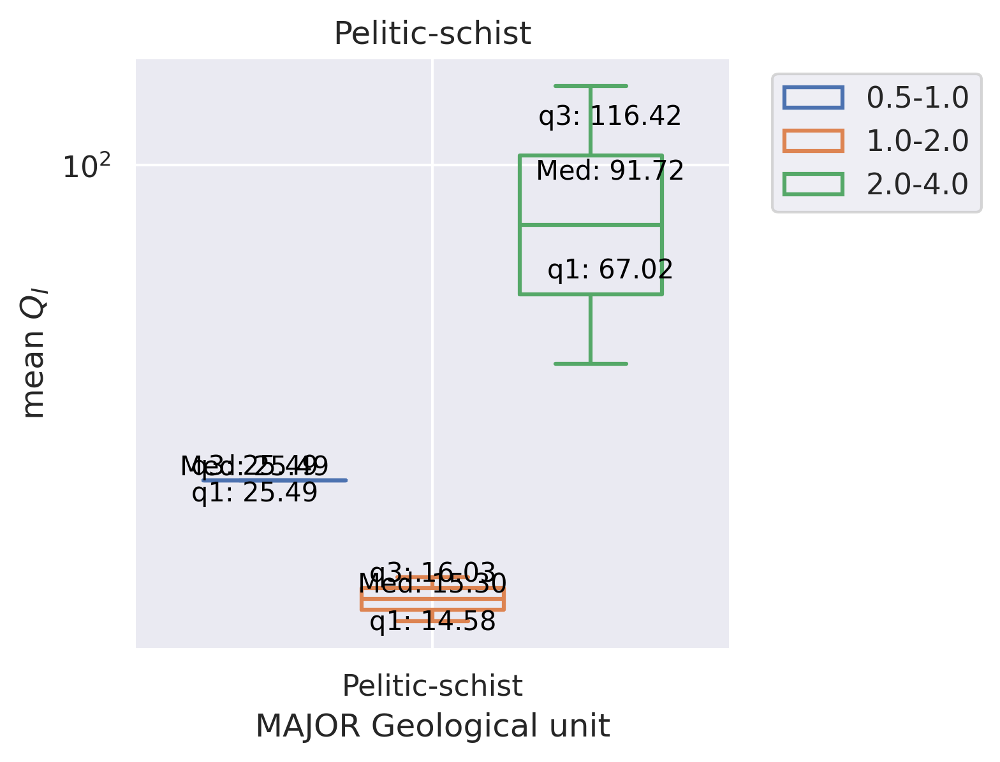

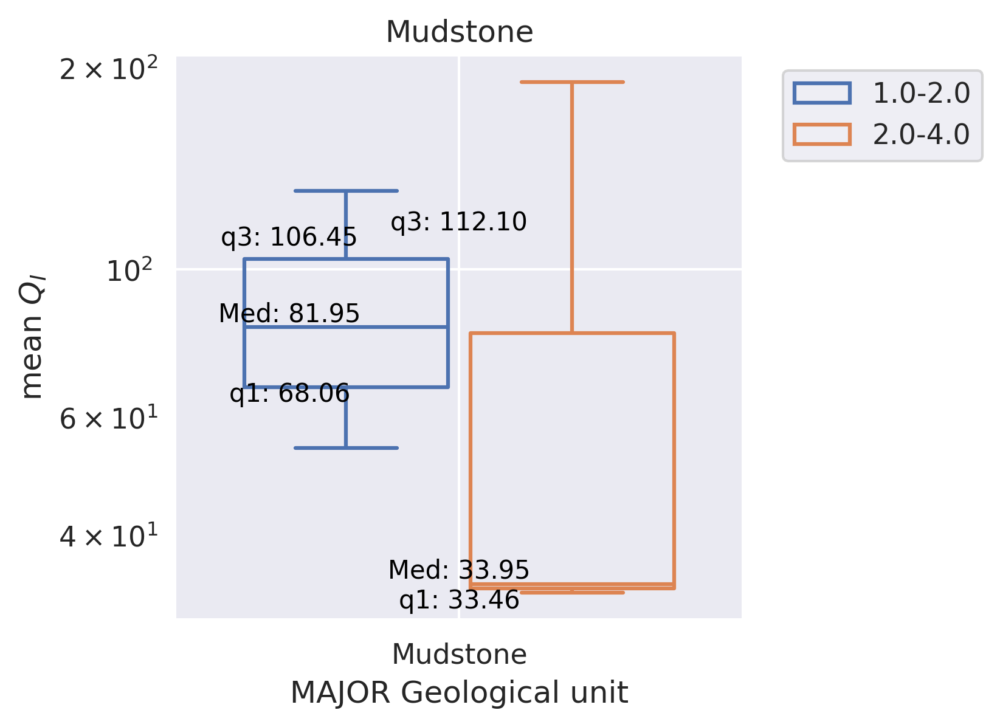

In [16]:

for rock in geo_filtered['MAJOR1'].unique():
    data_geo = geo_filtered[geo_filtered['MAJOR1'] == rock]
    # Initialize the figure with a logarithmic x axis
    f, ax = plt.subplots(figsize=(4,4))
    ax.set_yscale("log")
    sns.boxplot(data=data_geo, y="meanQ", x="MAJOR1", hue="fband", gap=0.1,
                 fill=False,
                )
    # sns.stripplot(data_geo, x="GENERALIZE", y="meanQ", hue="fband", size=2,)
    # sns.violinplot(data=data_geo, y="meanQ", x="GENERALIZE", hue="fband", fill=False,)
    for n,fb in enumerate(data_geo.fband.unique()):
        data_in = data_geo[data_geo['fband'] == fb]
        med = data_in['meanQ'].median()
        q1 = data_in['meanQ'].quantile(0.25)
        q3 = data_in['meanQ'].quantile(0.75)
        
        # Get the position on the x-axis for the current category
        xpos = n*0.3-0.3
        
        # Plot the mean and quartiles as text on the plot
        ax.text(xpos, med, f'Med: {med:.2f}', ha='center', va='bottom', color='black', fontsize=10)
        ax.text(xpos, q1, f'q1: {q1:.2f}', ha='center', va='top', color='black', fontsize=10)
        ax.text(xpos, q3, f'q3: {q3:.2f}', ha='center', va='bottom', color='black', fontsize=10)

    # Tweak the visual presentation
    ax.xaxis.grid(True)
    ax.yaxis.grid(True)
    ax.set(ylabel="mean $Q_I$", xlabel="MAJOR Geological unit", title=f'{rock}')
    sns.despine(trim=True, left=True)
    ax.legend(loc='upper right', bbox_to_anchor=(1.45, 1), ncol=1)
    plt.gcf().set_dpi(300)
    plt.show()


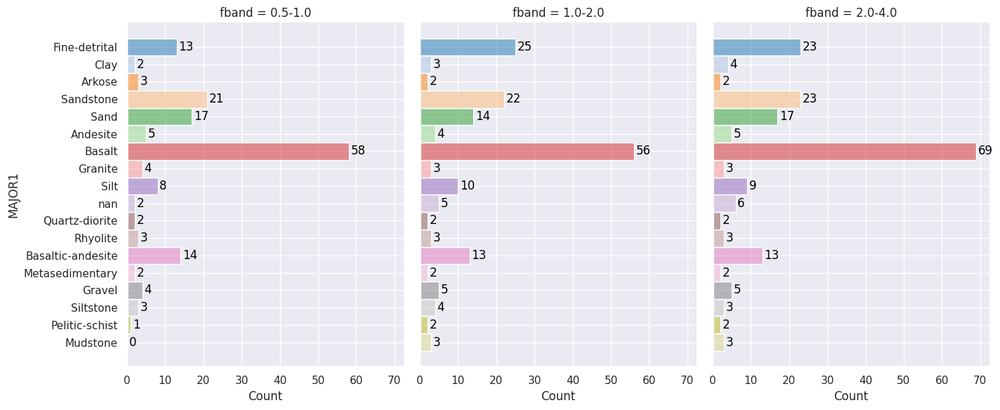

In [17]:
g= sns.displot(
    geo_filtered, y="MAJOR1", hue="MAJOR1", col="fband", bins=1,
    binwidth=3, height=6, facet_kws=dict(margin_titles=True),legend=False,
    aspect=0.8, palette="tab20"
)
original_order = geo_filtered['MAJOR1'].unique()
# Loop over each facet and add count annotations
for ax in g.axes.flat:
    # Get the name of the facet (fband) from the title and filter the data for each facet
    facet_title = ax.get_title().split(" = ")[-1]  # Extracts the facet title after 'fband = '
    data_facet = geo_filtered[geo_filtered['fband'] == facet_title]
    
    # Count occurrences for each category in GENERALIZE, preserving order
    counts = data_facet['MAJOR1'].value_counts().reindex(original_order).fillna(0)

    # Add text for each category's count
    for i, (category, count) in enumerate(counts.items()):
        ax.text(count + 0.5, i, f'{int(count)}', color='black', ha='left', va='center')
plt.tight_layout()


/tmp/ipykernel_3272176/2075228631.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geo_filtered['MAJOR1'] = pd.Categorical(geo_filtered['MAJOR1'], categories=original_order, ordered=True)


coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


Plotting Fine-detrital with color #1f77b4
Plotting Clay with color #aec7e8
Plotting Arkose with color #ff7f0e
Plotting Sandstone with color #ffbb78
Plotting Sand with color #2ca02c
Plotting Andesite with color #98df8a
Plotting Basalt with color #ff9896
Plotting Granite with color #9467bd
Plotting Silt with color #c5b0d5
Plotting nan with color #8c564b
Plotting Quartz-diorite with color #c49c94
Plotting Rhyolite with color #e377c2
Plotting Basaltic-andesite with color #7f7f7f
Plotting Metasedimentary with color #c7c7c7
Plotting Gravel with color #bcbd22
Plotting Siltstone with color #dbdb8d
Plotting Pelitic-schist with color #17becf
Plotting Mudstone with color #9edae5


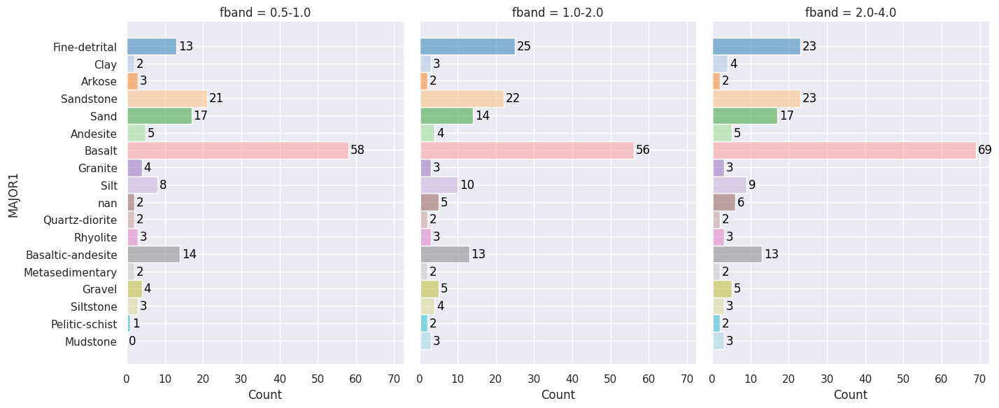

In [18]:
# Step 1: Ensure 'GENERALIZE' is in its original order
original_order = geo_filtered['MAJOR1'].unique()
geo_filtered['MAJOR1'] = pd.Categorical(geo_filtered['MAJOR1'], categories=original_order, ordered=True)

# Step 2: Create a fixed color map dictionary based on the original order using a consistent color palette
cmap = plt.get_cmap('tab20', len(original_order))
color_map = {category: to_hex(cmap(i)[:3]) for i, category in enumerate(original_order)}

# Step 3: Plotting with Seaborn using the fixed color map
g = sns.displot(
    geo_filtered, y="MAJOR1", hue="MAJOR1", col="fband", bins=1,
    binwidth=3, height=6, facet_kws=dict(margin_titles=True), legend=False,
    aspect=0.8, palette=color_map  # Use the fixed color map here
)
# Loop over each facet and add count annotations
for ax in g.axes.flat:
    # Get the name of the facet (fband) from the title and filter the data for each facet
    facet_title = ax.get_title().split(" = ")[-1]  # Extracts the facet title after 'fband = '
    data_facet = geo_filtered[geo_filtered['fband'] == facet_title]
    
    # Count occurrences for each category in GENERALIZE, preserving order
    counts = data_facet['MAJOR1'].value_counts().reindex(original_order).fillna(0)

    # Add text for each category's count
    for i, (category, count) in enumerate(counts.items()):
        ax.text(count + 0.5, i, f'{int(count)}', color='black', ha='left', va='center')
        
# Step 4: Now plot the map with PyGMT using the same color mapping
region = [-126, -116, 41.8, 49.5]
proj = 'M6c'
fig = pygmt.Figure()
pygmt.config(MAP_GRID_PEN='0.01p,150', MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p')

# Plot the basemap
fig.basemap(region=region, projection=proj, frame="a2g1")
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )
# Add coastlines and water
fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p", water='lightblue', shorelines='0/0.1p')

# Plot each unique GENERALIZE category using the color map dictionary
for key in original_order:
    subset = geo_filtered[geo_filtered['MAJOR1'] == key]
    
    # Check if subset is not empty
    if not subset.empty:
        color = color_map[key]  # Use the fixed color for the category
        print(f"Plotting {key} with color {color}")
        fig.plot(
            x=subset['stlo_x'],
            y=subset['stla_x'],
            style="s0.15c",  # Square style with size
            pen="0.1p,black",
            fill=color,
            label=key
        )
    else:
        print(f"No data to plot for {key}")

# Add a legend
fig.legend(position="JMR",)
# fig.savefig(fname='GEOunitmap_histo.png' , dpi=600)
# plt.savefig(fname='GEOunit_histo.png' , dpi=600)

/home/kffeng/miniconda/envs/codetest/lib/python3.9/site-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/kffeng/miniconda/envs/codetest/lib/python3.9/site-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/kffeng/miniconda/envs/codetest/lib/python3.9/site-packages/numpy/lib/_function_base_impl.py:2914: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/home/kffeng/miniconda/envs/codetest/lib/python3.9/site-packages/numpy/lib/_function_base_impl.py:2773: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/home/kffeng/miniconda/envs/codetest/lib/python3.9/site-packages/numpy/lib/_function_base_impl.py:2773: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


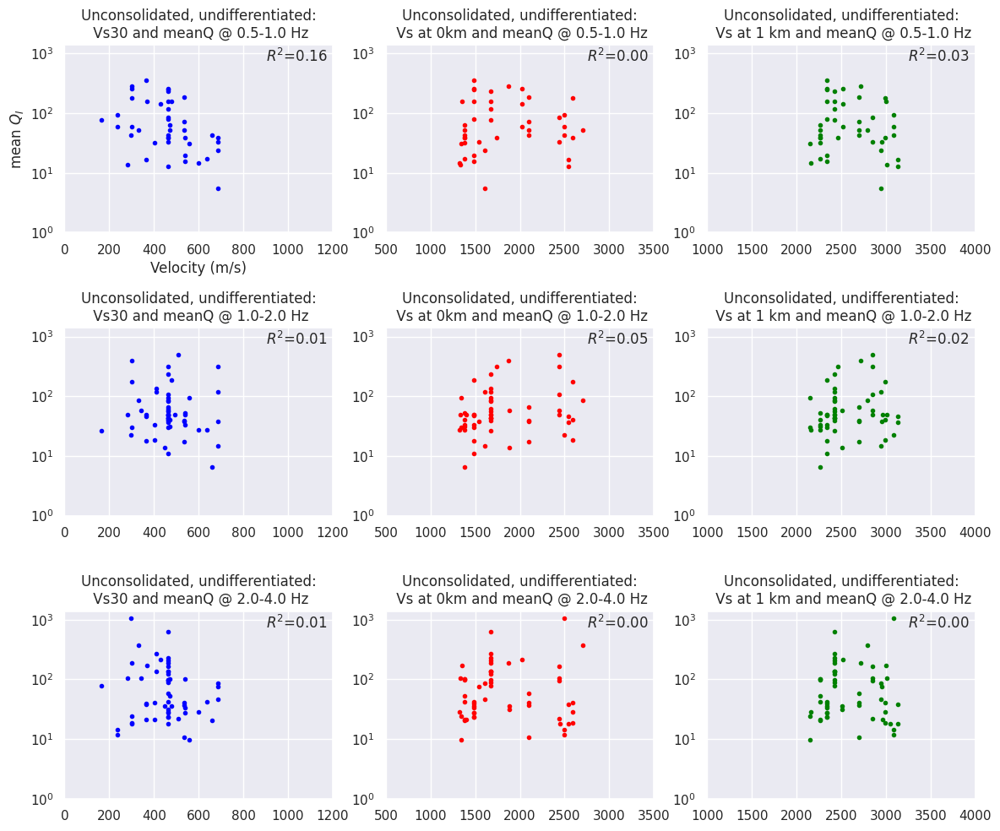

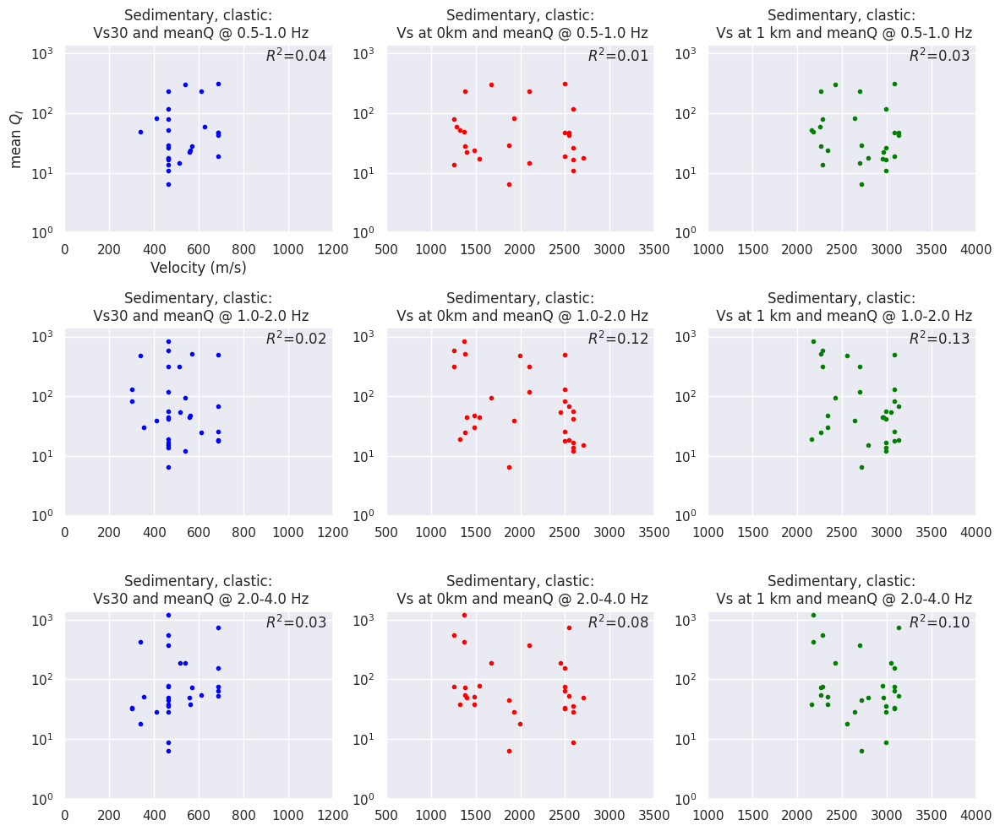

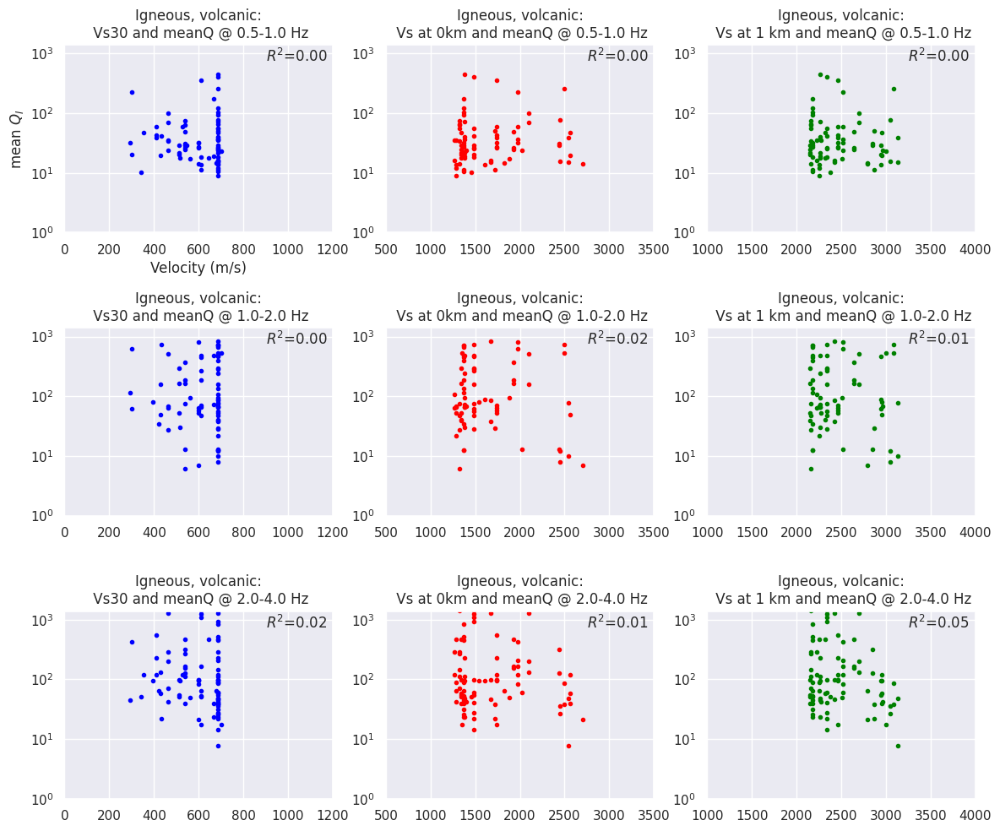

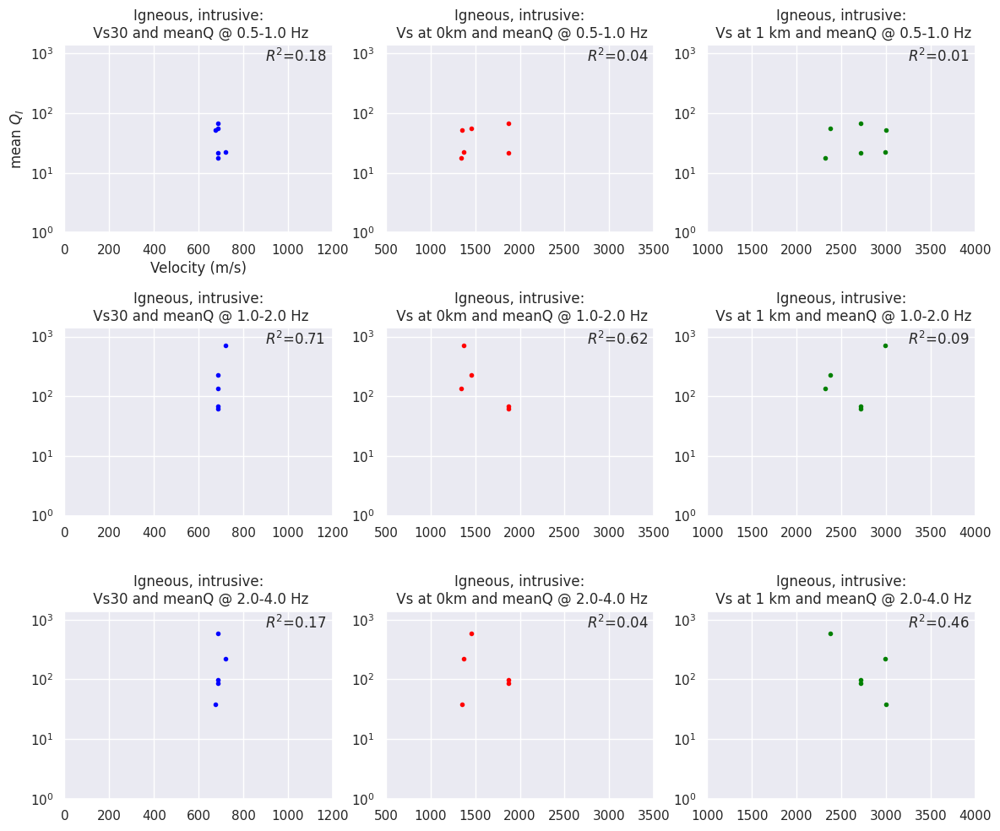

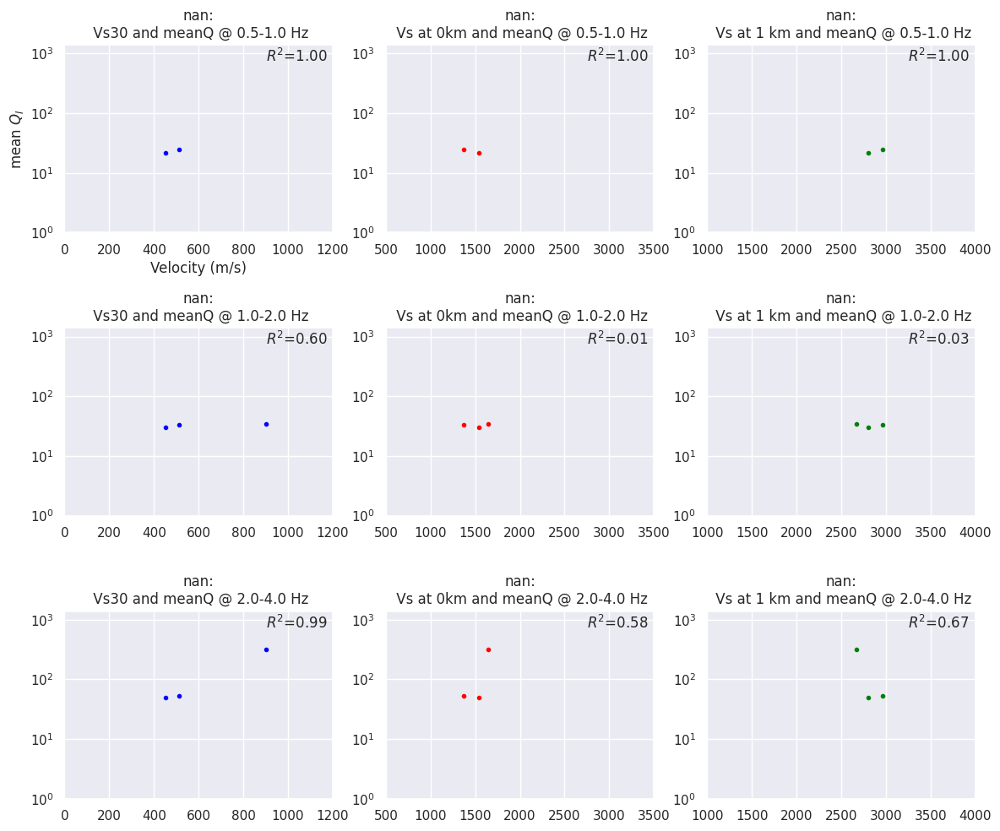

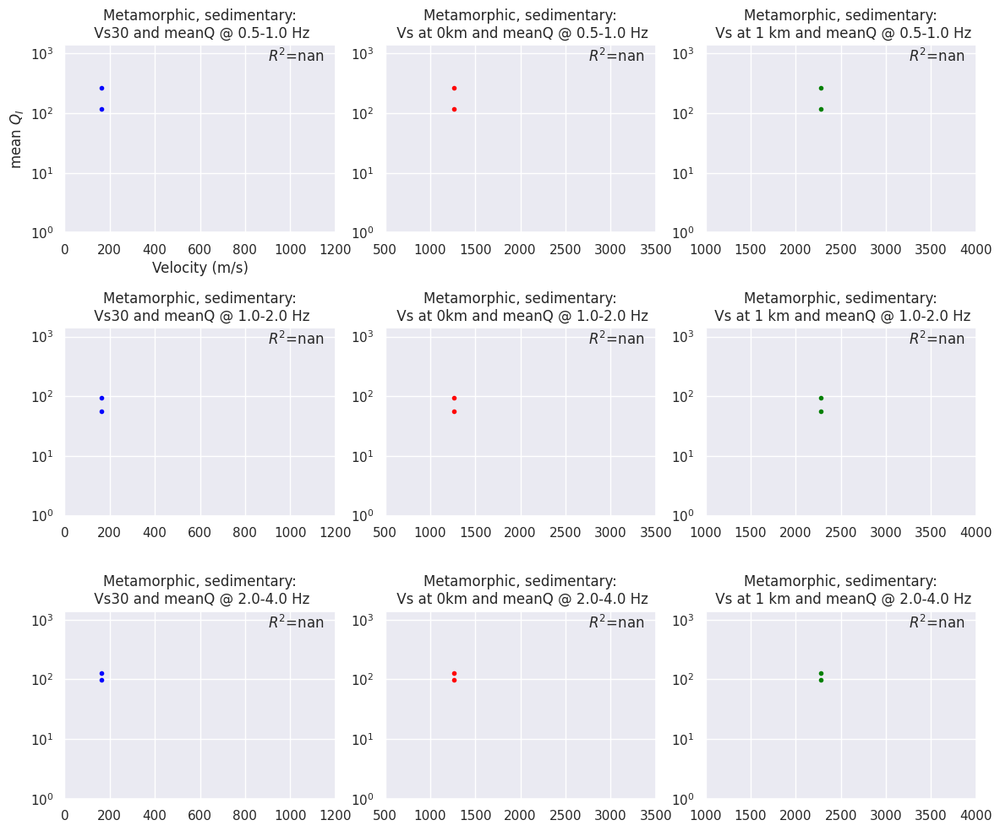

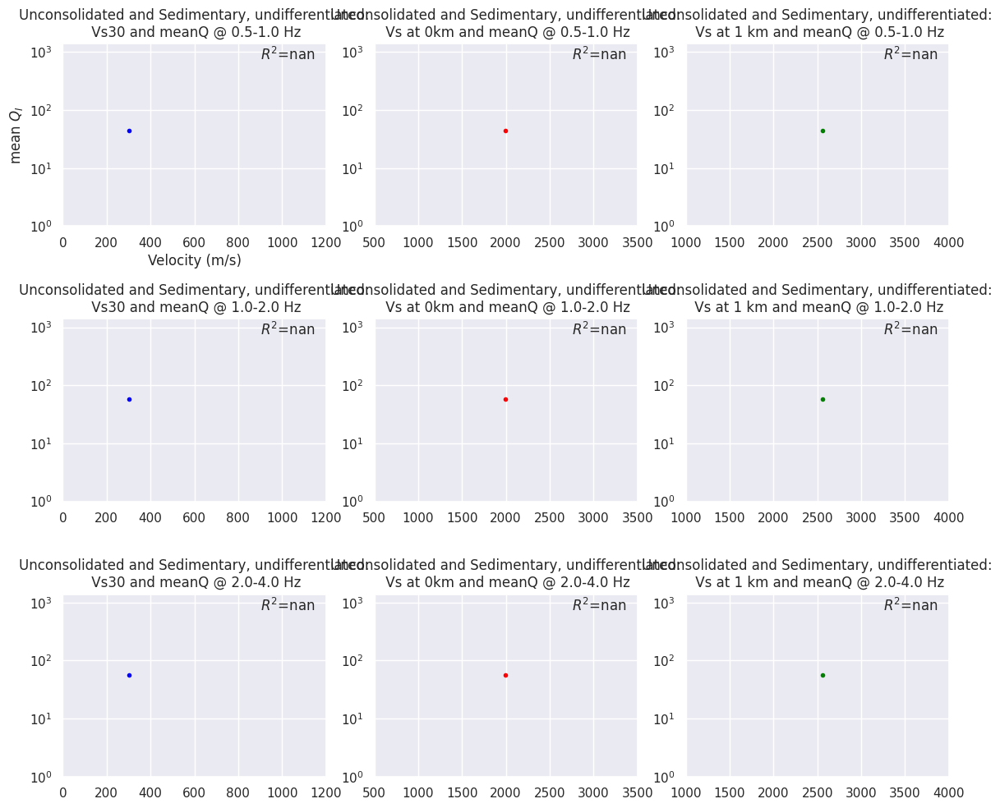

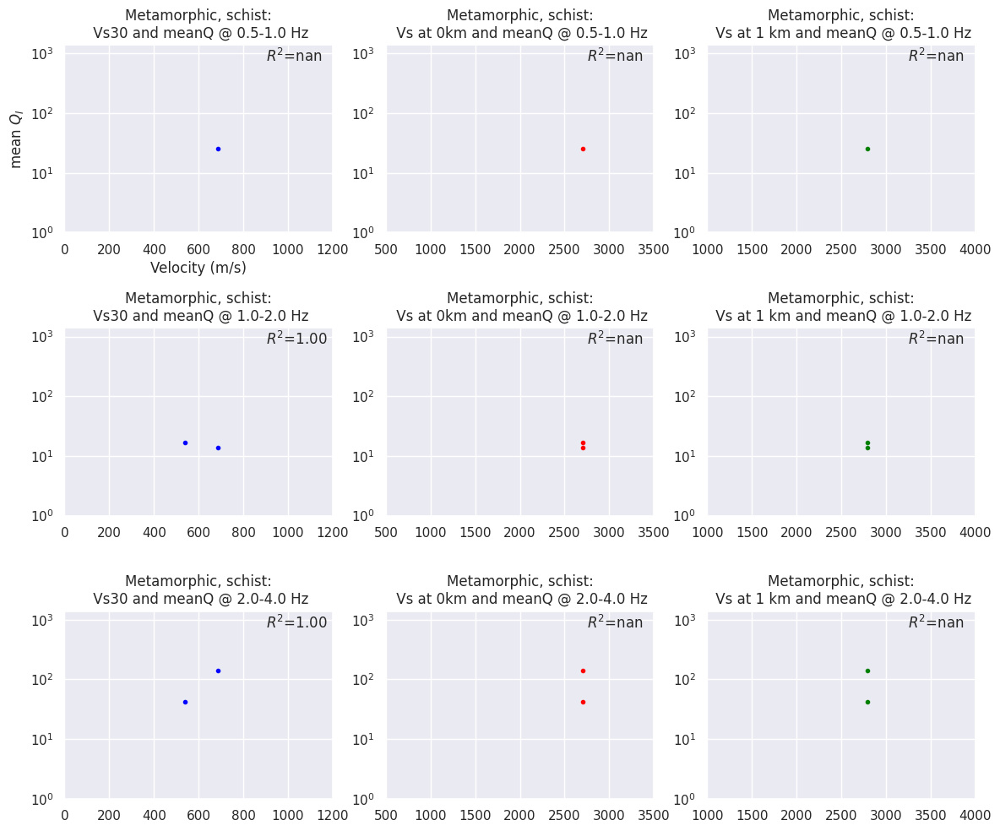

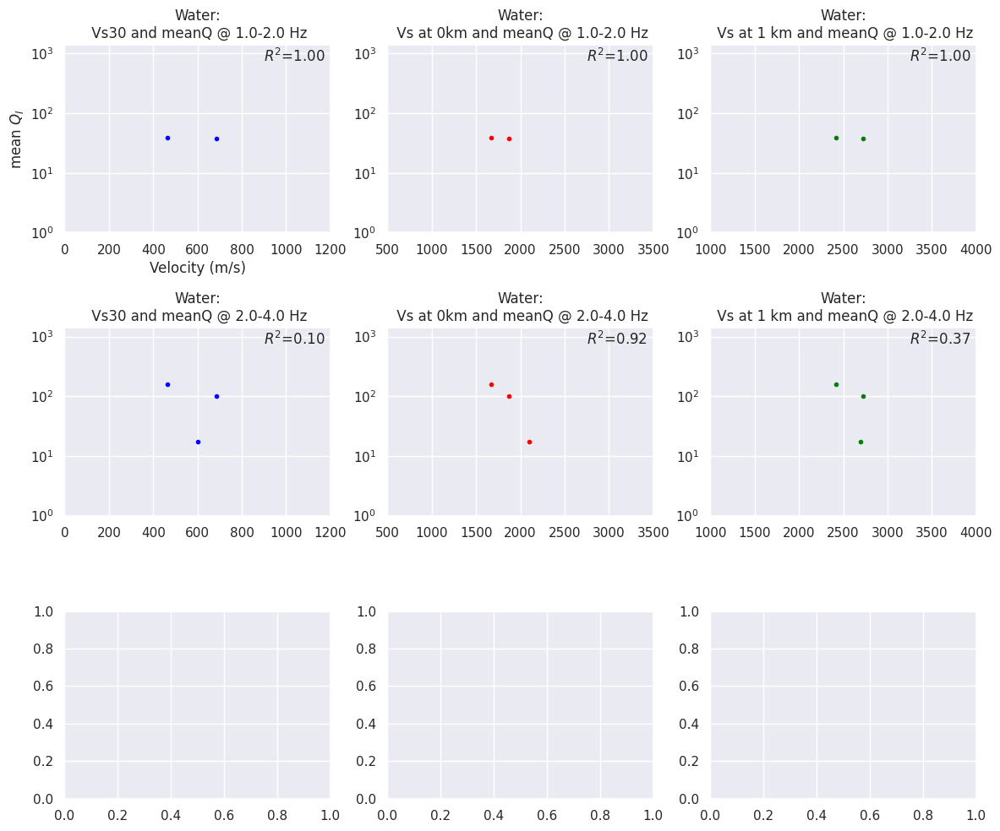

In [21]:


for rock in geo_filtered['GENERALIZE'].unique():
    data_geo = geo_filtered[geo_filtered['GENERALIZE'] == rock]
    data_geo = data_geo[(data_geo['GENERALIZE']== rock) & (data_geo['meanb'] > 0.01)]

    # Initialize the figure with a logarithmic x axis
    f, ax = plt.subplots(3,1,figsize=(12,10))

    for n,fb in enumerate(data_geo.fband.unique()):
        data_in = data_geo[data_geo['fband'] == fb]
        ax[n,0].set_yscale("log")
        ax[n,0].set_ylim(1,1400)
        ax[n,0].set_xlim(0,1200)
        
        ax[n,0].set_title(f'{rock}:\n Vs30 and meanQ @ {fb} Hz')        
        ax[n,0].plot( data_in['vs30']     ,data_in['meanQ'],'.', label=f'vs30 ', color='blue')        

        R0=np.corrcoef(data_in['vs30'],np.log(data_in['meanQ']))[0,1]
        ax[n,0].text(0.75,0.91,f'$R^2$={R0**2:.2f}',transform=ax[n,0].transAxes)
 

    ax[0,0].set(ylabel="mean $Q_I$", xlabel='Velocity (m/s)')
    plt.tight_layout()
    
    


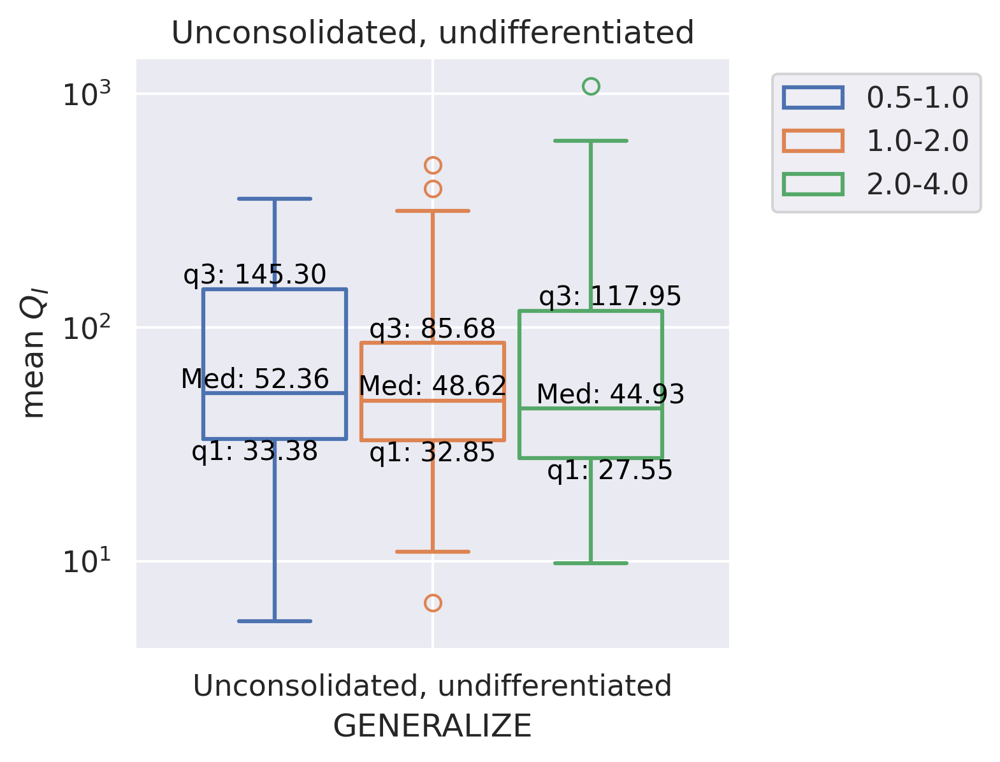

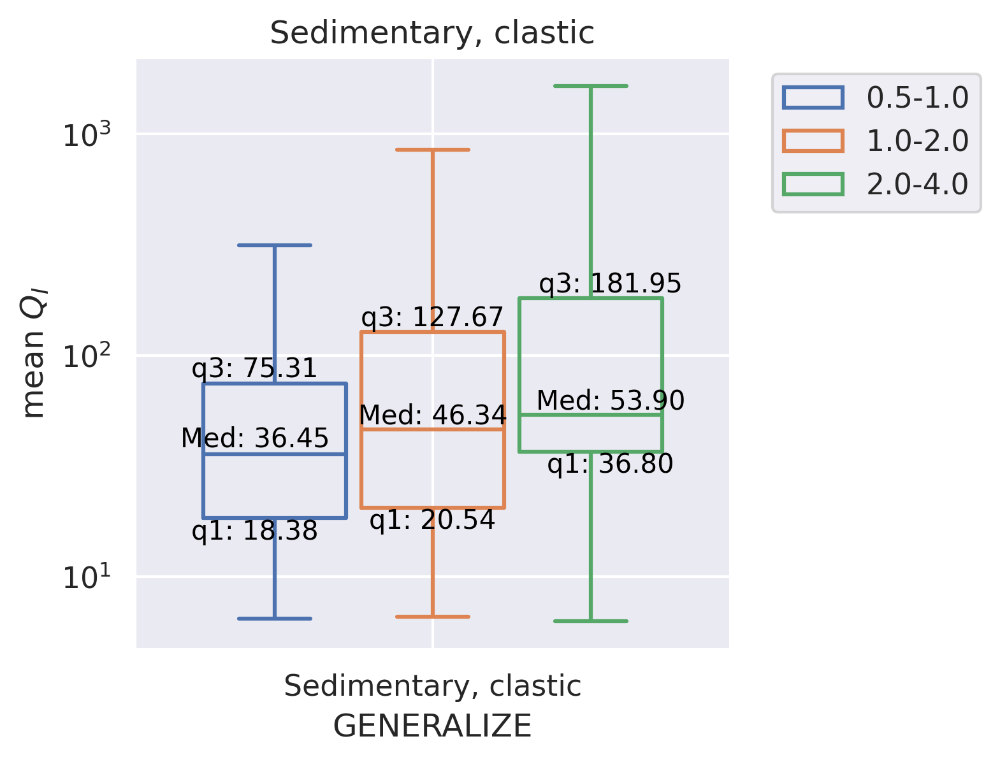

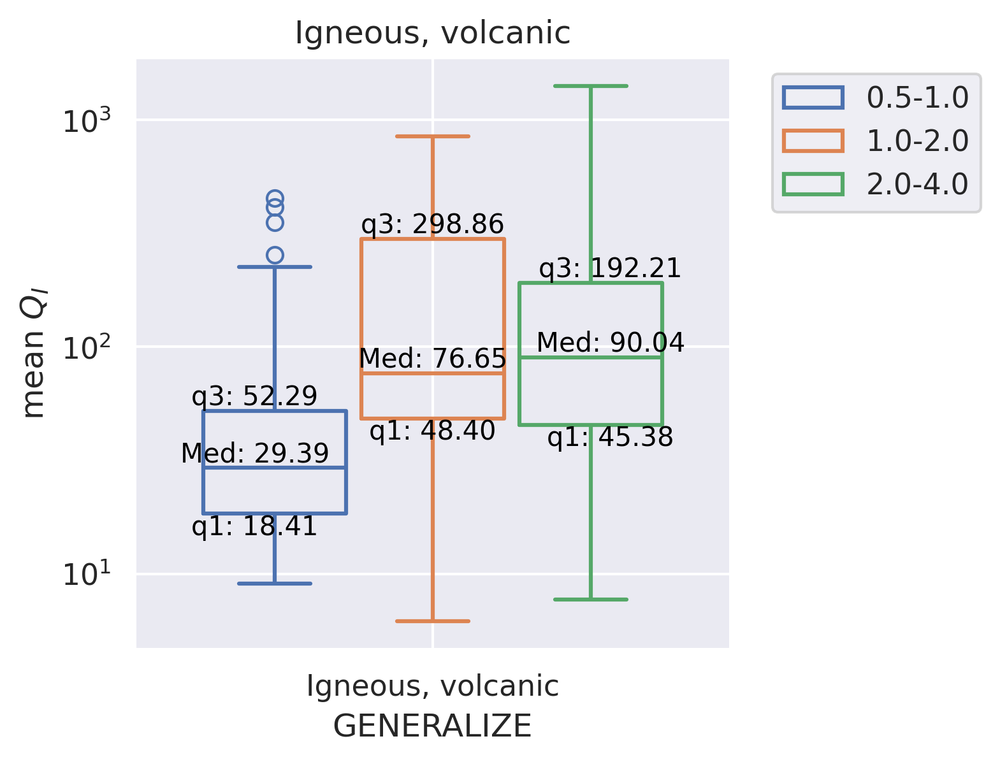

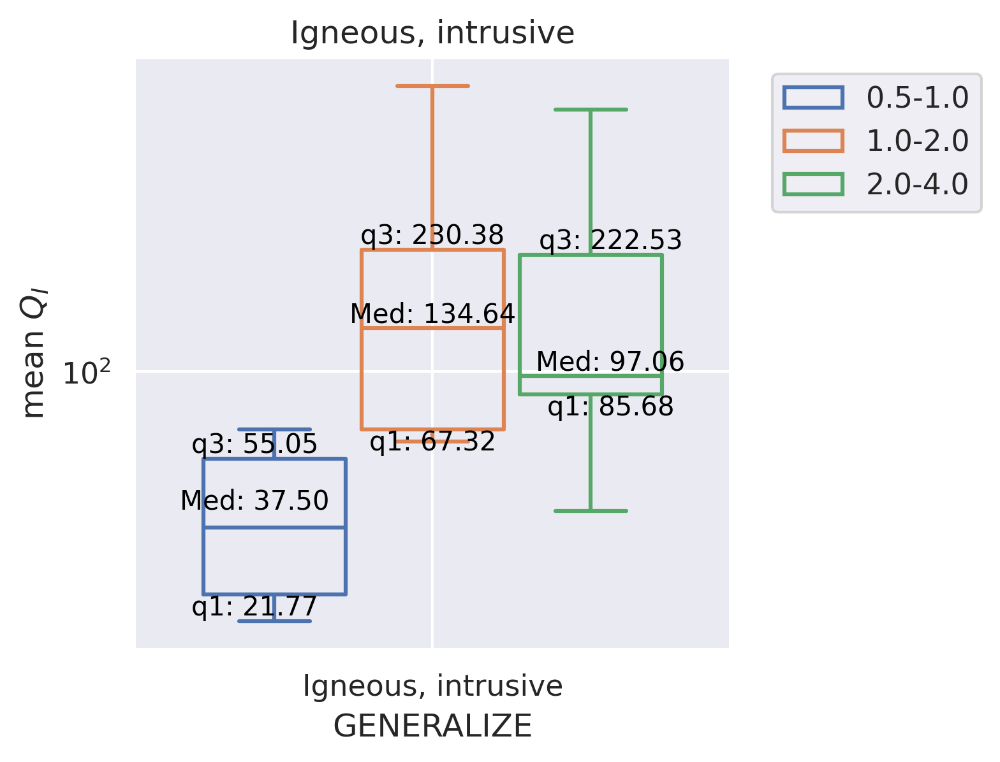

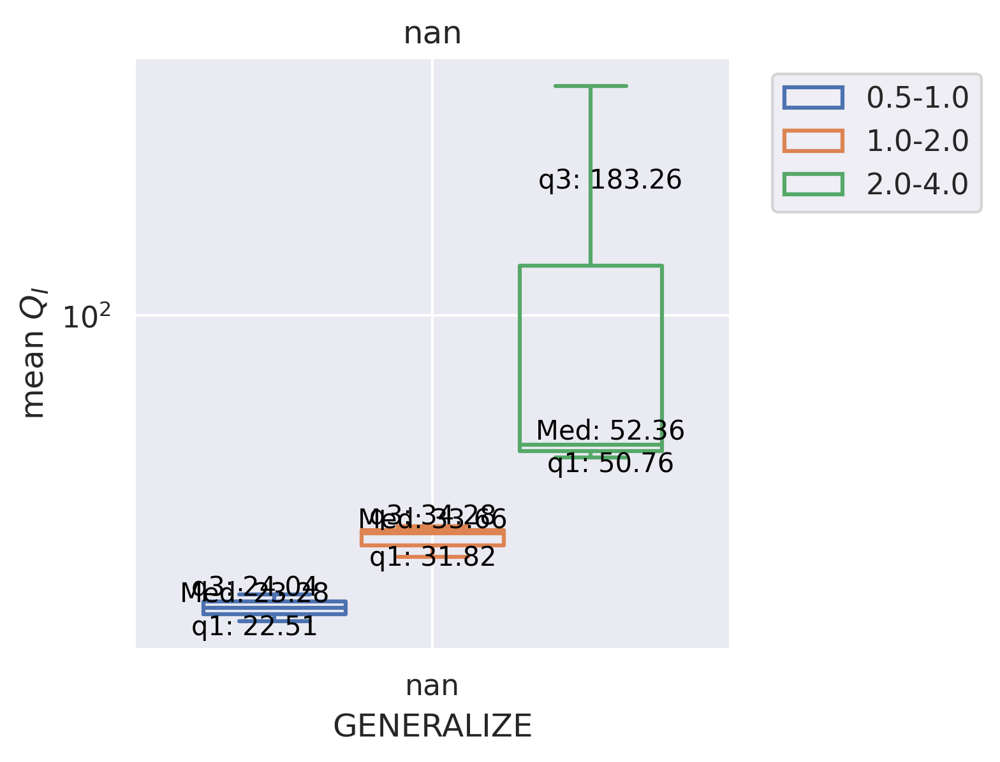

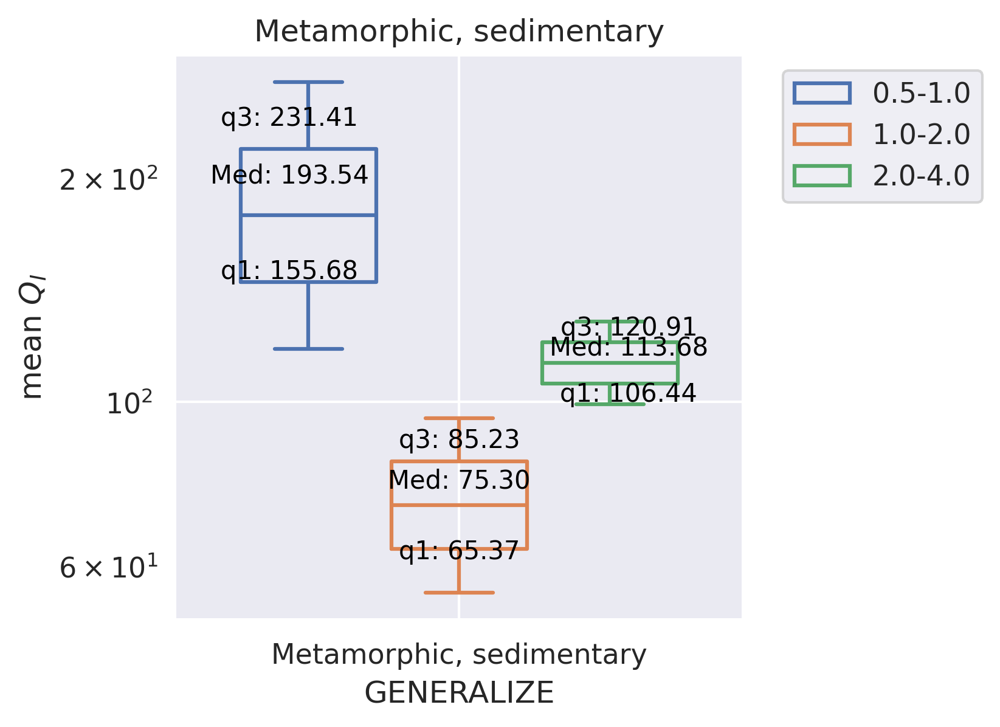

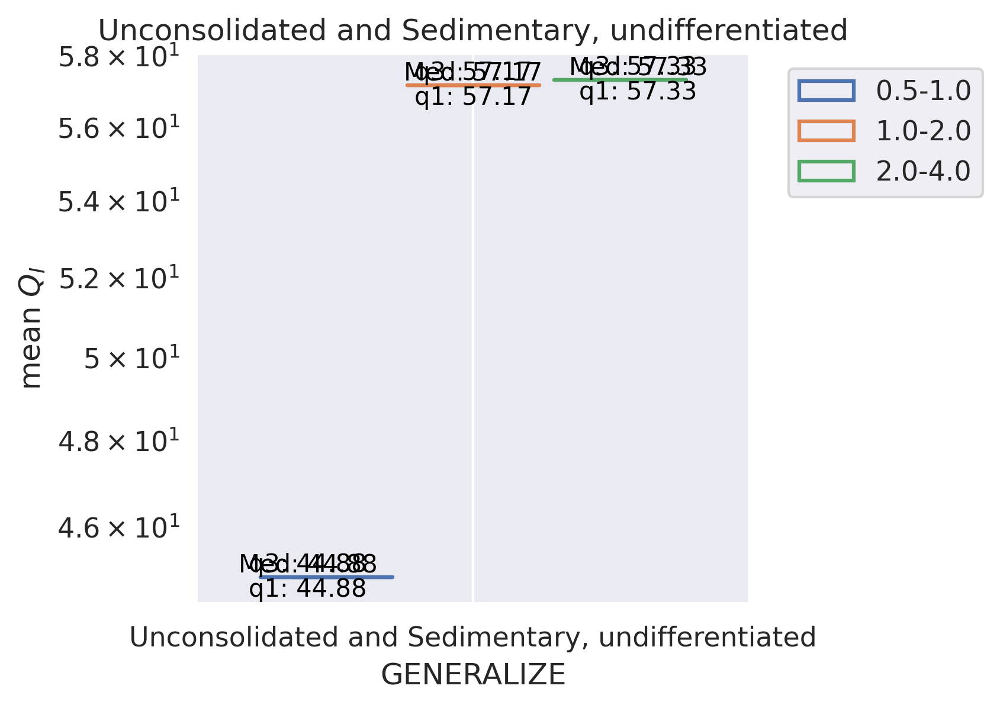

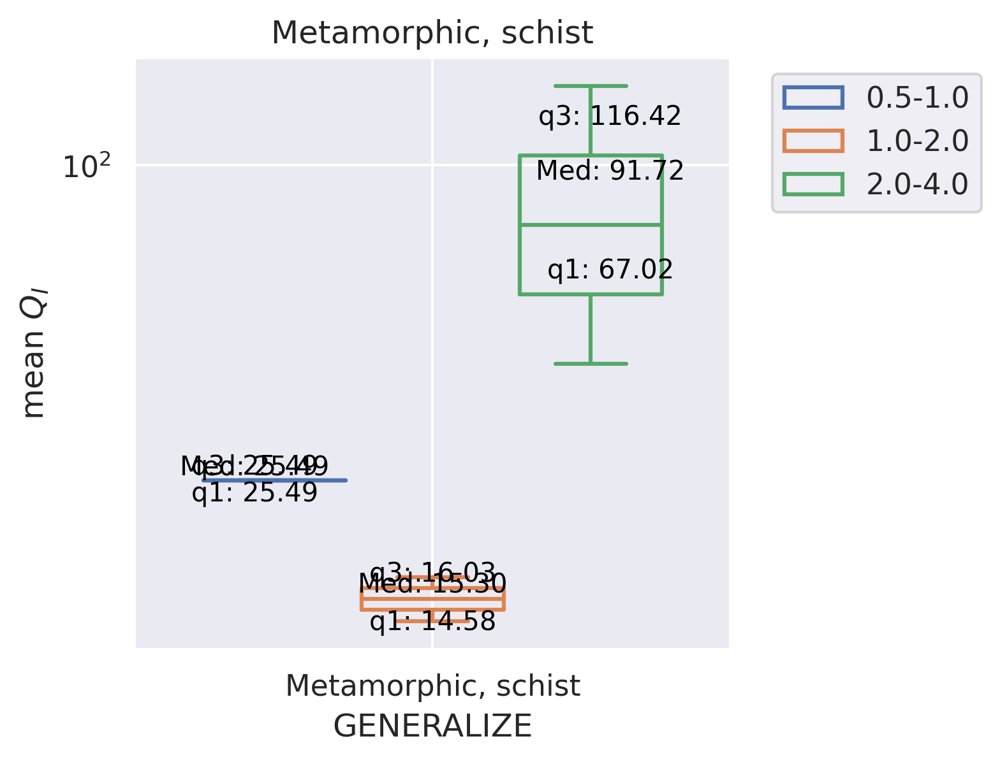

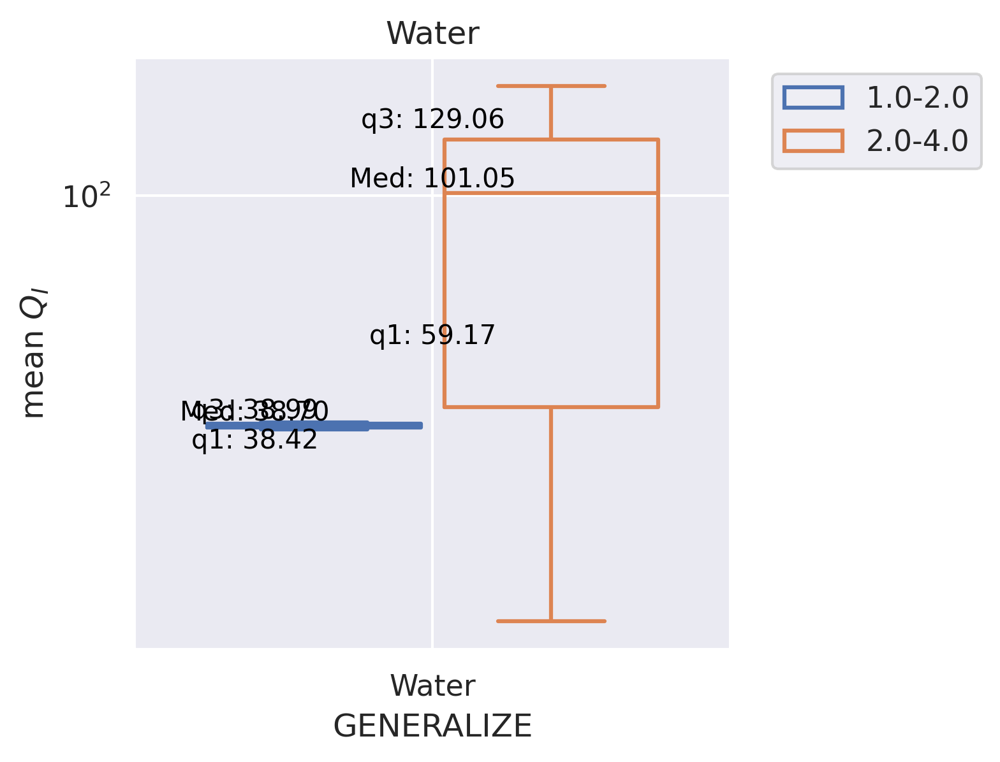

In [22]:

for rock in geo_filtered['GENERALIZE'].unique():
    data_geo = geo_filtered[geo_filtered['GENERALIZE'] == rock]
    # Initialize the figure with a logarithmic x axis
    f, ax = plt.subplots(figsize=(4,4))
    ax.set_yscale("log")
    sns.boxplot(data=data_geo, y="meanQ", x="GENERALIZE", hue="fband", gap=0.1,
                 fill=False,
                )
    # sns.stripplot(data_geo, x="GENERALIZE", y="meanQ", hue="fband", size=2,)
    # sns.violinplot(data=data_geo, y="meanQ", x="GENERALIZE", hue="fband", fill=False,)
    for n,fb in enumerate(data_geo.fband.unique()):
        data_in = data_geo[data_geo['fband'] == fb]
        med = data_in['meanQ'].median()
        q1 = data_in['meanQ'].quantile(0.25)
        q3 = data_in['meanQ'].quantile(0.75)
        
        # Get the position on the x-axis for the current category
        xpos = n*0.3-0.3
        
        # Plot the mean and quartiles as text on the plot
        ax.text(xpos, med, f'Med: {med:.2f}', ha='center', va='bottom', color='black', fontsize=10)
        ax.text(xpos, q1, f'q1: {q1:.2f}', ha='center', va='top', color='black', fontsize=10)
        ax.text(xpos, q3, f'q3: {q3:.2f}', ha='center', va='bottom', color='black', fontsize=10)

    # Tweak the visual presentation
    ax.xaxis.grid(True)
    ax.yaxis.grid(True)
    ax.set(ylabel="mean $Q_I$", xlabel="GENERALIZE", title=f'{rock}')
    sns.despine(trim=True, left=True)
    ax.legend(loc='upper right', bbox_to_anchor=(1.45, 1), ncol=1)
    plt.gcf().set_dpi(300)
    plt.show()


In [24]:
print(geo_filtered['MAJOR1'].unique().tolist())

['Fine-detrital', 'Clay', 'Arkose', 'Sandstone', 'Sand', 'Andesite', 'Basalt', 'Granite', 'Silt', 'nan', 'Quartz-diorite', 'Rhyolite', 'Basaltic-andesite', 'Metasedimentary', 'Gravel', 'Siltstone', 'Pelitic-schist', 'Mudstone']


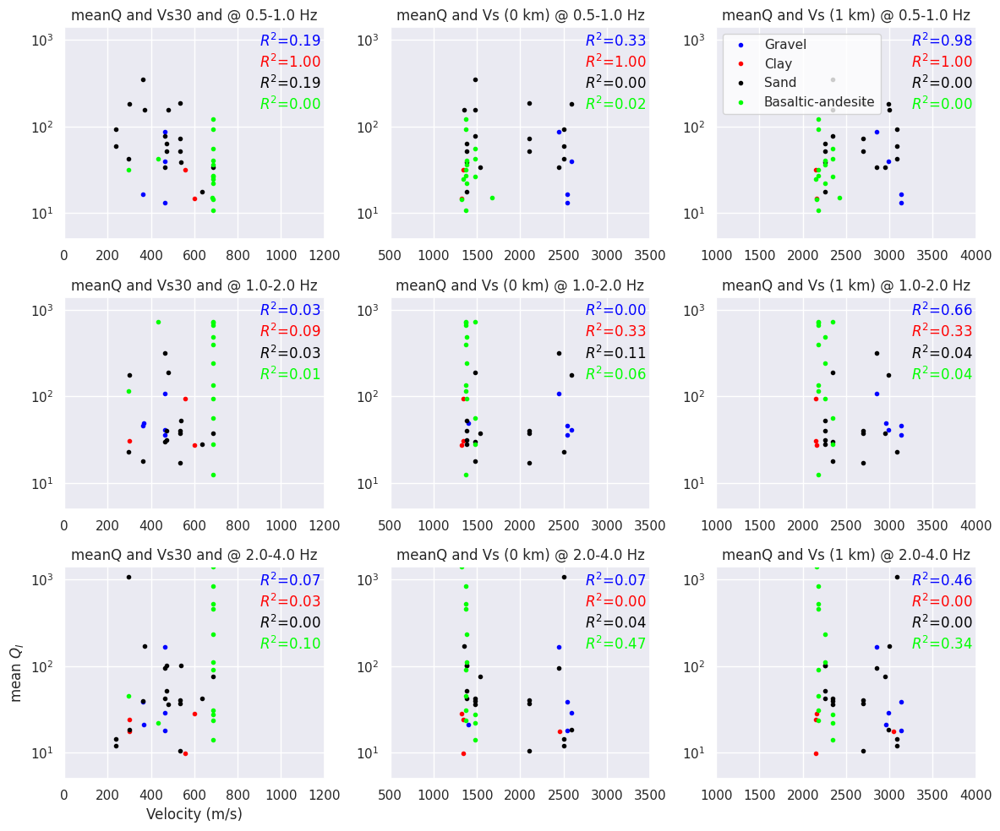

In [22]:
# Initialize the figure with a logarithmic x axis
f, ax = plt.subplots(3,1,figsize=(12,10))

selected_rock = ['Gravel','Clay', 'Sand','Basaltic-andesite']
# selected_rock = ['Gravel','Clay', 'Sand','Sandstone']
colors=['blue','red','black','lime']
# colors=['blue','red','black','magenta']
for ktype, rock in enumerate(selected_rock):
    data_geo = geo_filtered[geo_filtered['MAJOR1'] == rock]
    data_geo = data_geo[data_geo['MAJOR1']== rock]
    color=colors[ktype]
    for n,fb in enumerate(data_geo.fband.unique()):
        data_in = data_geo[data_geo['fband'] == fb]
        ax[n,0].set_yscale("log")
        ax[n,0].set_ylim(5,1400)
        ax[n,0].set_xlim(0,1200)

        ax[n,0].set_title(f'meanQ and Vs30 and @ {fb} Hz')
        ax[n,1].set_title(f'meanQ and Vs (0 km) @ {fb} Hz')
        ax[n,2].set_title(f'meanQ and Vs (1 km) @ {fb} Hz')
        
        ax[n,0].plot( data_in['vs30']     ,data_in['meanQ'],'.', label=f'vs30 ', color=color)
        R0=np.corrcoef(data_in['vs30'],np.log(data_in['meanQ']))[0,1]
        ax[n,0].text(0.75,0.91-0.1*ktype,f'$R^2$={R0**2:.2f}',transform=ax[n,0].transAxes, color=color)
    ax[2,0].set(ylabel="mean $Q_I$", xlabel='Velocity (m/s)')
    ax[0,0].legend(selected_rock, ).get_frame().set_facecolor('white')
    plt.tight_layout()



/tmp/ipykernel_3209284/3861551567.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geo_filtered['GENERALIZE'] = pd.Categorical(geo_filtered['GENERALIZE'], categories=original_order, ordered=True)


coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


Plotting Unconsolidated, undifferentiated with color #8dd3c7
Plotting Sedimentary, clastic with color #ffffb3
Plotting Igneous, volcanic with color #fb8072
Plotting Igneous, intrusive with color #80b1d3
Plotting nan with color #b3de69
Plotting Metamorphic, sedimentary with color #fccde5
Plotting Unconsolidated and Sedimentary, undifferentiated with color #bc80bd
Plotting Metamorphic, schist with color #ccebc5
Plotting Water with color #ffed6f


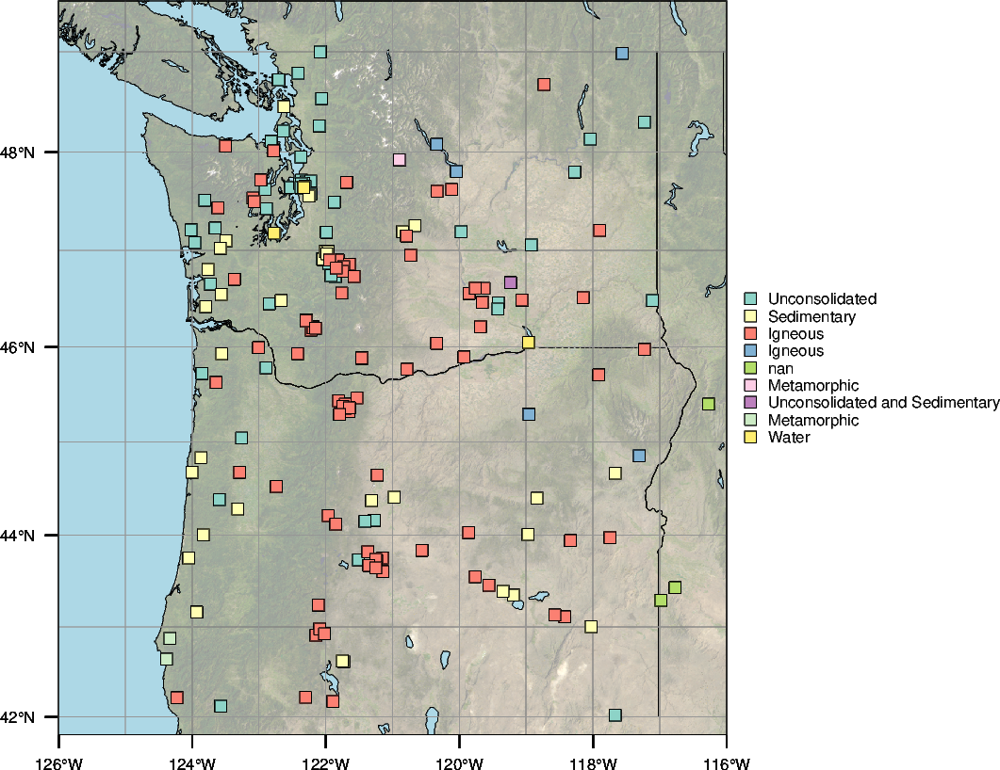

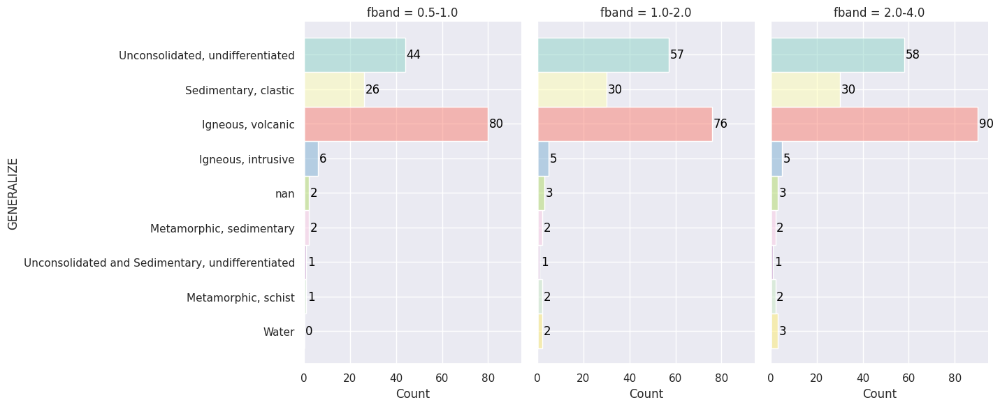

In [28]:
# Step 1: Ensure 'GENERALIZE' is in its original order
original_order = geo_filtered['GENERALIZE'].unique()
geo_filtered['GENERALIZE'] = pd.Categorical(geo_filtered['GENERALIZE'], categories=original_order, ordered=True)

# Step 2: Create a fixed color map dictionary based on the original order using a consistent color palette
cmap = plt.get_cmap('Set3', len(original_order))
color_map = {category: to_hex(cmap(i)[:3]) for i, category in enumerate(original_order)}

# Step 3: Plotting with Seaborn using the fixed color map
g = sns.displot(
    geo_filtered, y="GENERALIZE", hue="GENERALIZE", col="fband", bins=1,
    binwidth=3, height=6, facet_kws=dict(margin_titles=True), legend=False,
    aspect=0.8, palette=color_map  # Use the fixed color map here
)
# Loop over each facet and add count annotations
for ax in g.axes.flat:
    # Get the name of the facet (fband) from the title and filter the data for each facet
    facet_title = ax.get_title().split(" = ")[-1]  # Extracts the facet title after 'fband = '
    data_facet = geo_filtered[geo_filtered['fband'] == facet_title]
    
    # Count occurrences for each category in GENERALIZE, preserving order
    counts = data_facet['GENERALIZE'].value_counts().reindex(original_order).fillna(0)

    # Add text for each category's count
    for i, (category, count) in enumerate(counts.items()):
        ax.text(count + 0.5, i, f'{int(count)}', color='black', ha='left', va='center')
        
# Step 4: Now plot the map with PyGMT using the same color mapping
region = [-126, -116, 41.8, 49.5]
proj = 'M6c'
fig = pygmt.Figure()
pygmt.config(MAP_GRID_PEN='0.01p,150', MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p')

# Plot the basemap
fig.basemap(region=region, projection=proj, frame="a2g1")
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )
# Add coastlines and water
fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p", water='lightblue', shorelines='0/0.1p')

# Plot each unique GENERALIZE category using the color map dictionary
for key in original_order:
    subset = geo_filtered[geo_filtered['GENERALIZE'] == key]
    
    # Check if subset is not empty
    if not subset.empty:
        color = color_map[key]  # Use the fixed color for the category
        print(f"Plotting {key} with color {color}")
        fig.plot(
            x=subset['stlo_x'],
            y=subset['stla_x'],
            style="s0.15c",  # Square style with size
            pen="0.1p,black",
            fill=color,
            label=key
        )
    else:
        print(f"No data to plot for {key}")

# Add a legend
fig.legend(position="JMR",)
fig.show()
# fig.savefig(fname='GEOgenermap_histo.png' , dpi=600)
# plt.savefig(fname='GEOgener_histo.png' , dpi=600)